In [1]:
import pandas as pd
import numpy as np
#import seaborn as sns
import datetime
from datetime import timedelta
import matplotlib.pyplot as plt

import random
#from deap import base, creator, tools

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

2024-11-26 00:50:56.877344: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-26 00:50:57.228709: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-26 00:50:58.054627: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/fernando/anaconda3/envs/tf/lib/
2024-11-26 00:50:58.055897: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plug

# Pré tratamento da base de dados
- Normalização dos atributos utilizando scaler entre 0 e 1
- Conversão dos angulos azimutais para sua versão de cos e sen
- Normalização da irrad e potencia

In [2]:
#testar

df = pd.read_csv( '/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/base_teste.csv', sep=',', index_col = 0)
df = df.loc[df['Year']>=2018]


duplicated_indices = df.index.duplicated()
duplicated_index_values = df.index[df.index.duplicated()].unique()
df.reset_index(inplace = True)
dup = list()
for i in duplicated_index_values:
    dup.append(df.loc[df['Date_Time'] == i].index)
for i in dup:
    df = df.drop(i[1])
df.set_index("Date_Time", inplace = True)
df.index = pd.to_datetime(df.index)
#Potencia céu claro
U0, U1 = 25, 6.84
Pstc, Gstc, Tstc, y = 156000, 1000, 25, 0.0045
df['Temperatura celula'] = df['Temperatura ambiente °C'] + (df['ghi']/(U0 + U1*df['Velocidade média do vento m/s']))
df['Pot_cs'] = Pstc*(df['ghi']/Gstc)*(1-y*(df['Temperatura celula']-Tstc))/1000

#calculo do k
df['k'] = df['Pot_BT']/df['Pot_cs']
df['k'] = df['k'].replace([np.nan, np.inf, -np.inf], 0)
df['k'] = df['k'].clip(upper=1)

#calculo da persistencia
df_p1 = df[['Pot_cs']].loc[df.index[0]+timedelta(hours = 1):]
df_p2 = df[['Pot_cs']].loc[df.index[0]+timedelta(hours = 2):]
df_p3 = df[['Pot_cs']].loc[df.index[0]+timedelta(hours = 3):]
df_p = df[['Pot_cs']].loc[df.index[0]+timedelta(hours = 24):]

k = df['k'].to_list()

df_p1['P1'] = df_p1['Pot_cs']*k[:-1]
df_p2['P2'] = df_p2['Pot_cs']*k[:-2]
df_p3['P3'] = df_p3['Pot_cs']*k[:-3]
df_p['P'] = df_p['Pot_cs']*k[:-24]

#conversão em dataframe
df = df.join([df_p1['P1'], df_p2['P2'], df_p3['P3'], df_p['P']])

#Normalização dos atributos
df.reset_index(inplace = True)

#Normalização por scaler
data = df[['Temperatura ambiente °C',
           'Velocidade média do vento m/s',
           'Temp']]
scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(data)
df_transformado=pd.DataFrame(scaler.transform(data),columns=data.columns)
df.drop(df_transformado.columns, axis=1, inplace = True)
df = df.join(df_transformado)

df['Irrad/CeuClaro'] = df['Irradiação Global horária(Inclinada 27°) kWh/m2']/df['ghi']

#Normalização 
df['Umidade Relativa %'] /= 100
df['cos_zenith']  = np.cos(np.deg2rad(df['zenith']))
df['sin_azimuth'] = np.sin(np.deg2rad(df['azimuth']))
df['Irradiação Global horária(Inclinada 27°) kWh/m2'] /= df['Extra Radiation']
df['Irrad'] /= df['Extra Radiation']

#Normalização da potencia
#df['Pot_saz'] = df['Pot_BT']/df['Pot_cs']


df['Pot_BT'] /= 156

df['P1'] /= 156
df['P2'] /= 156
df['P3'] /= 156
df['P'] /=156

df['Pot_BT'] = df['Pot_BT'].replace([np.nan, np.inf], -1)
df['Irrad'] = df['Irrad'].replace([np.nan, np.inf], -1)
df['Temp'] = df['Temp'].replace([np.nan, np.inf], -1)

df['Degradacao'] = 1  
df.loc[df['Year'] == 2019, 'Degradacao'] = 1-0.05 
df.loc[df['Year'] == 2020, 'Degradacao'] = 1-(0.05*2)
df.loc[df['Year'] == 2021, 'Degradacao'] = 1-(0.05*3)
df.loc[df['Year'] == 2022, 'Degradacao'] = 1-(0.05*4)

df.set_index("Date_Time", inplace = True)

df

/tmp/ipykernel_97135/2147406116.py:82: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.95' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df['Year'] == 2019, 'Degradacao'] = 1-0.05


,apparent_zenith,zenith,apparent_elevation,elevation,azimuth,equation_of_time,Irrad,Pot_BT,ghi,dni,...,P3,P,Temperatura ambiente °C,Velocidade média do vento m/s,Temp,Irrad/CeuClaro,cos_zenith,sin_azimuth,Pot_saz,Degradacao
Date_Time,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,130.394652,130.394652,-40.394652,-40.394652,201.411181,-3.365720,-1.0,-1.0,NaN,NaN,...,NaN,NaN,0.530087,0.119115,-1.000000,NaN,-0.648049,-0.365058,NaN,1.0
2018-01-01 01:00:00,133.364985,133.364985,-43.364985,-43.364985,183.276183,-3.385340,0.0,0.0,NaN,NaN,...,NaN,NaN,0.518260,0.076271,0.319247,NaN,-0.686643,-0.057149,NaN,1.0
2018-01-01 02:00:00,131.900567,131.900567,-41.900567,-41.900567,164.590377,-3.404951,0.0,0.0,0.0,0.0,...,NaN,NaN,0.510471,0.049906,0.310259,NaN,-0.667840,0.265718,NaN,1.0
2018-01-01 03:00:00,126.364311,126.364311,-36.364311,-36.364311,148.258313,-3.424553,0.0,0.0,0.0,0.0,...,0.0,NaN,0.498933,0.048493,0.303593,NaN,-0.592917,0.526091,NaN,1.0
2018-01-01 04:00:00,117.838187,117.838187,-27.838187,-27.838187,135.420335,-3.444146,0.0,0.0,0.0,0.0,...,0.0,NaN,0.496048,0.057910,0.300839,NaN,-0.466976,0.701900,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 20:00:00,103.452849,103.452849,-13.452849,-13.452849,237.088021,-3.167663,0.0,0.0,0.0,0.0,...,0.0,0.0,0.520279,0.000942,0.326993,NaN,-0.232645,-0.839506,NaN,0.8
2022-12-31 21:00:00,114.397814,114.397814,-24.397814,-24.397814,228.196151,-3.187402,0.0,0.0,0.0,0.0,...,0.0,0.0,0.492009,0.000471,0.300728,NaN,-0.413070,-0.745431,NaN,0.8
2022-12-31 22:00:00,123.691327,123.691327,-33.691327,-33.691327,216.508829,-3.207132,0.0,0.0,0.0,0.0,...,0.0,0.0,0.471528,0.000000,0.299595,NaN,-0.554718,-0.594947,NaN,0.8


# Criação da função para geramento das bases de treino
- Valores de potencia precisam ser diferentes de 0
- É necessário haver dados de timestep e futuro para montagem dos dados
- Retorno em formato de array

In [6]:
def janela_flutuante(df, n_past, n_future, input_tag):

    yt= []
    xt = []
    y_index = []
    #kt = []
    
    index = df.loc[(df['Pot_BT'].isnull() == False)].index
        

        #Janela deslizante
    for i in index:
        #(np.isin(df['Pot_BT'].loc['2018-01-01 00:00:00':'2018-01-01 23:00:00'].value_counts().index,-1).sum())
        if (np.isin(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts().index, -1).sum() == 0):
            #evitar que tenha [0,0,0] adicionado agr
            if len(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts())>=n_future:
                if len(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)]) == n_past:
                    if df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)].isnull().sum().sum() == 0:
                        y_index.append(df.loc[i:i + datetime.timedelta(hours=n_future-1)].index)
                        # Seleção da Potencia [dia que queres prever : até que dia no futuro] 
                        yt.append(df[['Pot_BT']].loc[i:i + datetime.timedelta(hours=n_future-1)])
                        #
                        xt.append(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)])
                        #kt.append(df[['Irradiação Global horária(Inclinada 27°) kWh/m2', 'Temperatura ambiente °C']].loc[i:i + datetime.timedelta(hours=n_future-1)])

    
    xt, yt = np.array(xt), np.array(yt)
    y_index = np.array(y_index)
    #kt = np.array(kt)
        
    #return xt, yt, kt
    return xt, yt, y_index

# Função de montagem do modelo 
- Montagem do modelo LSTM podendo ter camada oculta ou não
- Atributos: unidades, timestep, futuro, dimensão de atributos e função de ativação

In [4]:
def lstm(units, timesteps, n_fut ,attributes, f, hidden_layer=0):
    model = Sequential()
    
    if hidden_layer == 0:
        model.add(LSTM(units[0], activation=f, input_shape=(timesteps, attributes), dropout=0.2, return_sequences=False))
    else:
        model.add(LSTM(units[0], activation=f, input_shape=(timesteps, attributes), dropout=0.2, return_sequences=True))
        
        for i in range(hidden_layer):
            if i == hidden_layer - 1:
                model.add(LSTM(units[i+1], activation=f, dropout=0.2, return_sequences=False))
            else:
                model.add(LSTM(units[i+1], activation=f, dropout=0.2, return_sequences=True))
    
    model.add(Dense(n_fut))
    
     # Compilação do modelo usando a função de perda personalizada
    model.compile(optimizer='adam', loss='mse')
    
    print(model.summary())
    
    return model

# Montagem das bases de treino, teste e validação
- Teste/Validação: 2021
    - Primeira metade do mes para validação e segunda metade para teste
- Treino: 2018 a 2020

In [5]:
df_treino = df.loc[(df['Year'] < 2022)]
df_treino.reset_index(inplace = True)
df_valida = df_treino.loc[round(len(df_treino) * 0.8):]
df_treino = df_treino.loc[:round(len(df_treino) * 0.8)]
#df_valida = df.loc[df['Year'] == 2021]
df_teste = df.loc[df['Year'] == 2022]
df_valida.set_index('Date_Time', inplace = True)
df_treino.set_index('Date_Time', inplace = True)
"""
df_valida = pd.DataFrame()
df_teste = pd.DataFrame()
#random_state = [286, 628, 57, 69, 206, 683, 309, 780, 100, 328, 990, 464]
for i in range (1,13):
    try:
        t,v = train_test_split(df['Day'].loc[(df['Year'] == 2022) & (df['Month'] == i)].unique(), 
                               test_size = 0.5, 
                               shuffle = False)
        df_valida = df_valida._append(df.loc[(df['Year'] == 2022) & (df['Month'] == i) & df['Day'].isin(t)])
        df_teste = df_teste._append(df.loc[(df['Year'] == 2022) & (df['Month'] == i) & df['Day'].isin(v)])
    except:
        pass
"""

"\ndf_valida = pd.DataFrame()\ndf_teste = pd.DataFrame()\n#random_state = [286, 628, 57, 69, 206, 683, 309, 780, 100, 328, 990, 464]\nfor i in range (1,13):\n    try:\n        t,v = train_test_split(df['Day'].loc[(df['Year'] == 2022) & (df['Month'] == i)].unique(), \n                               test_size = 0.5, \n                               shuffle = False)\n        df_valida = df_valida._append(df.loc[(df['Year'] == 2022) & (df['Month'] == i) & df['Day'].isin(t)])\n        df_teste = df_teste._append(df.loc[(df['Year'] == 2022) & (df['Month'] == i) & df['Day'].isin(v)])\n    except:\n        pass\n"

# Função de avaliação do modelo
- Calculo RMSE
- Calculo Bias
- Calculo Regressão linear (Coeficiente e Intercept)
- Plot grafico dispersão (Previsto x Medido)
- Todas os calculos desconsideram os valores de zero

#### LSTM 

In [25]:
def avaliacao(model,xs, ys, ysi, persistencia):
    y = model.predict(xs)
    #Montagem do DataFrame
    lista_df = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, y):
            lista.append(
                {
                    "Date_Time":i[h],
                    f"Previsao_{h+1}":j[h]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_df.append(x)
       
    lista_ = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, ys):
            lista.append(
                {
                    "Date_Time":i[h],
                    "Observado":j[h][0]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_.append(x)
        
    df_provisorio = pd.concat(lista_, axis = 1)
    df_provisorio = df_provisorio.mode(axis=1)
    
    lista_df.append(df_provisorio)
    
    df_final = pd.concat(lista_df, axis = 1)
    df_final.rename(columns = {0:'Observado'}, inplace = True)
    df_final = df_final.join(persistencia)
    
    del (lista, lista_, df_provisorio, lista_df, x)

    # Analise
    for i in range (1,4):
        print('   --- Hora {0} Futuro ---   '.format(i))
        
        x = df_final[['Observado',f'Previsao_{i}', f'P{i}']].loc[df_final['Observado']*156>=1]
        x.dropna(inplace = True)
        a = x[f'Previsao_{i}'] #previsto
        b = x['Observado'] #medido
        c = x[f'P{i}']#persistencia
        
        #RMSE
        from sklearn.metrics import mean_squared_error
        rmse = mean_squared_error(a, b, squared=False)
        #Vies
        bias = np.mean(a-b)/np.mean(b)
        #Informações da curva 
        from sklearn.linear_model import LinearRegression
        r = LinearRegression().fit(np.array(b).reshape(-1, 1),np.array(a))
        #Skill Score
        rmse_p = mean_squared_error(c, b, squared=False)
        ss = 1 - (rmse/rmse_p)
        
        print(f"RMSE: {rmse} \nVies: {bias} \nCorrelação: {r.coef_[0]} \nIntercept: {r.intercept_} \nSkill Score: {ss} \n#Previsões: {len(a)} \nRMSE Persistencia: {rmse_p} \n")
        
        import seaborn as sns
        # Crie uma grade 2x2 para os subplots
        fig, axes = plt.subplots(figsize=(8, 6))
        
        # Plote os gráficos individuais em cada posição da grade
        ax = sns.regplot(x = b,y = a, marker='x', color='.3', line_kws=dict(color="r"), ax = axes)
        ax.set(xlabel = 'Valor medido pot', ylabel = 'Valor previsto pot')
        ax.set_title('{0} hora no futuro'.format(i))
                  
        # Ajuste o layout para evitar sobreposição
        plt.tight_layout()
        
        # Exiba o gráfico
        plt.show()

    return df_final

In [9]:
def avaliacao_chuva_seco(model,xs, ys, ysi, persistencia):
    y = model.predict(xs)
    #Montagem do DataFrame
    lista_df = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, y):
            lista.append(
                {
                    "Date_Time":i[h],
                    f"Previsao_{h+1}":j[h]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_df.append(x)
       
    lista_ = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, ys):
            lista.append(
                {
                    "Date_Time":i[h],
                    "Observado":j[h][0]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_.append(x)
        
    df_provisorio = pd.concat(lista_, axis = 1)
    df_provisorio = df_provisorio.mode(axis=1)
    
    lista_df.append(df_provisorio)
    
    df_final = pd.concat(lista_df, axis = 1)
    df_final.rename(columns = {0:'Observado'}, inplace = True)
    df_final = df_final.join(persistencia)
    
    del (lista, lista_, df_provisorio, lista_df, x)

    # Separando inicio dos meses chuvosos e secos
    inicio_chuvoso = pd.to_datetime("10-01-2021")  # 1º de outubro
    fim_chuvoso = pd.to_datetime("03-31-2021")  # 31 de março
    
    # Separando os dados em períodos seco e chuvoso
    dados_chuvosos = df_final[(df_final.index.month >= inicio_chuvoso.month) | (df_final.index.month <= fim_chuvoso.month)]
    dados_secos = df_final[(df_final.index.month > fim_chuvoso.month) & (df_final.index.month <= inicio_chuvoso.month)]

    # Analise
    for data,m in zip([dados_chuvosos,dados_secos],['Meses Chuvosos', 'Meses Secos']):
        print(f'  ==={m}===   ')
        for i in range (1,4):
            print('   --- Hora {0} Futuro ---   '.format(i))
            
            x = data[['Observado',f'Previsao_{i}', f'P{i}']].loc[data['Observado']*156>=1]
            x.dropna(inplace = True)
            a = x[f'Previsao_{i}'] #previsto
            b = x['Observado'] #medido
            c = x[f'P{i}']#persistencia
    
            #RMSE
            from sklearn.metrics import mean_squared_error
            rmse = mean_squared_error(a, b, squared=False)
            #Vies
            bias = np.mean(a-b)/np.mean(b)
            #Informações da curva 
            from sklearn.linear_model import LinearRegression
            r = LinearRegression().fit(np.array(b).reshape(-1, 1),np.array(a))
            #Skill Score
            rmse_p = mean_squared_error(c, b, squared=False)
            ss = 1 - (rmse/rmse_p)
            
            print(f"RMSE: {rmse} \nVies: {bias} \nCorrelação: {r.coef_[0]} \nIntercept: {r.intercept_} \nSkill Score: {ss} \n#Previsões: {len(a)} \nRMSE Persistencia: {rmse_p} \n")
    
            import seaborn as sns
            # Crie uma grade 2x2 para os subplots
            fig, axes = plt.subplots(figsize=(8, 6))
            
            # Plote os gráficos individuais em cada posição da grade
            ax = sns.regplot(x = b,y = a, marker='x', color='.3', line_kws=dict(color="r"), ax = axes)
            ax.set(xlabel = 'Valor medido pot', ylabel = 'Valor previsto pot')
            ax.set_title('{0} hora no futuro'.format(i))
                      
            # Ajuste o layout para evitar sobreposição
            plt.tight_layout()
            
            # Exiba o gráfico
            plt.show()

    return df_final

#### Encoder decoder LSTM

In [127]:
def avaliacao_ae(m, xs, ys, ysi, persistencia):
    y = m.predict(xs)
    #Montagem do DataFrame
    lista_df = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, y):
            lista.append(
                {
                    "Date_Time":i[h],
                    f"Previsao_{h+1}":j[h][0]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_df.append(x)
       
    lista_ = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, ys):
            lista.append(
                {
                    "Date_Time":i[h],
                    "Observado":j[h][0]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_.append(x)
        
    df_provisorio = pd.concat(lista_, axis = 1)
    df_provisorio = df_provisorio.mode(axis=1)
    
    lista_df.append(df_provisorio)
    
    df_final = pd.concat(lista_df, axis = 1)
    df_final.rename(columns = {0:'Observado'}, inplace = True)
    df_final = df_final.join(persistencia)
 
    del (lista, lista_, df_provisorio, lista_df, x)

    # Analise
    for i in range (1,4):
        print('   --- Hora {0} Futuro ---   '.format(i))
        
        x = df_final[['Observado',f'Previsao_{i}', f'P{i}']].loc[df_final['Observado']*156>=10]
        x.dropna(inplace = True)
        a = x[f'Previsao_{i}'] #previsto
        b = x['Observado'] #medido
        c = x[f'P{i}']#persistencia
        
        #RMSE
        from sklearn.metrics import mean_squared_error
        rmse = mean_squared_error(a, b, squared=False)
        #Vies
        bias = np.mean(a-b)/np.mean(b)
        #Informações da curva 
        from sklearn.linear_model import LinearRegression
        r = LinearRegression().fit(np.array(b).reshape(-1, 1),np.array(a))
        #Skill Score
        rmse_p = mean_squared_error(c, b, squared=False)
        ss = 1 - (rmse/rmse_p)
        
        print(f"RMSE: {rmse} \nVies: {bias} \nCorrelação: {r.coef_[0]} \nIntercept: {r.intercept_} \nSkill Score: {ss} \n#Previsões: {len(a)} \nRMSE Persistencia: {rmse_p} \n")
        
        import seaborn as sns
        # Crie uma grade 2x2 para os subplots
        fig, axes = plt.subplots(figsize=(8, 6))
        
        # Plote os gráficos individuais em cada posição da grade
        ax = sns.regplot(x = b,y = a, marker='x', color='.3', line_kws=dict(color="r"), ax = axes)
        ax.set(xlabel = 'Valor medido pot', ylabel = 'Valor previsto pot')
        ax.set_title('{0} hora no futuro'.format(i))
                  
        # Ajuste o layout para evitar sobreposição
        plt.tight_layout()
        
        # Exiba o gráfico
        plt.show()

    return df_final

In [8]:
def avaliacao_ae_chuva_seco(m, xs, ys, ysi, persistencia):
    y = m.predict(xs)
    #Montagem do DataFrame
    lista_df = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, y):
            lista.append(
                {
                    "Date_Time":i[h],
                    f"Previsao_{h+1}":j[h][0]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_df.append(x)
       
    lista_ = list()
    for h in range (0,3):
        lista = list()
        
        for i, j in zip(ysi, ys):
            lista.append(
                {
                    "Date_Time":i[h],
                    "Observado":j[h][0]
                })
            
        x = pd.DataFrame(lista)
        x.set_index("Date_Time", inplace = True)
        lista_.append(x)
        
    df_provisorio = pd.concat(lista_, axis = 1)
    df_provisorio = df_provisorio.mode(axis=1)
    
    lista_df.append(df_provisorio)
    
    df_final = pd.concat(lista_df, axis = 1)
    df_final.rename(columns = {0:'Observado'}, inplace = True)
    df_final = df_final.join(persistencia)
    
    del (lista, lista_, df_provisorio, lista_df, x)

    # Separando inicio dos meses chuvosos e secos
    inicio_chuvoso = pd.to_datetime("10-01-2021")  # 1º de outubro
    fim_chuvoso = pd.to_datetime("03-31-2021")  # 31 de março
    
    # Separando os dados em períodos seco e chuvoso
    dados_chuvosos = df_final[(df_final.index.month >= inicio_chuvoso.month) | (df_final.index.month <= fim_chuvoso.month)]
    dados_secos = df_final[(df_final.index.month > fim_chuvoso.month) & (df_final.index.month <= inicio_chuvoso.month)]

    # Analise
    for data,m in zip([dados_chuvosos,dados_secos],['Meses Chuvosos', 'Meses Secos']):
        print(f'  ==={m}===   ')
        for i in range (1,4):
            print('   --- Hora {0} Futuro ---   '.format(i))
            
            x = data[['Observado',f'Previsao_{i}', f'P{i}']].loc[data['Observado']*156>=1]
            x.dropna(inplace = True)
            a = x[f'Previsao_{i}'] #previsto
            b = x['Observado'] #medido
            c = x[f'P{i}']#persistencia
    
            #RMSE
            from sklearn.metrics import mean_squared_error
            rmse = mean_squared_error(a, b, squared=False)
            #Vies
            bias = np.mean(a-b)/np.mean(b)
            #Informações da curva 
            from sklearn.linear_model import LinearRegression
            r = LinearRegression().fit(np.array(b).reshape(-1, 1),np.array(a))
            #Skill Score
            rmse_p = mean_squared_error(c, b, squared=False)
            ss = 1 - (rmse/rmse_p)
            
            print(f"RMSE: {rmse} \nVies: {bias} \nCorrelação: {r.coef_[0]} \nIntercept: {r.intercept_} \nSkill Score: {ss} \n#Previsões: {len(a)} \nRMSE Persistencia: {rmse_p} \n")
    
            import seaborn as sns
            # Crie uma grade 2x2 para os subplots
            fig, axes = plt.subplots(figsize=(8, 6))
            
            # Plote os gráficos individuais em cada posição da grade
            ax = sns.regplot(x = b,y = a, marker='x', color='.3', line_kws=dict(color="r"), ax = axes)
            ax.set(xlabel = 'Valor medido pot', ylabel = 'Valor previsto pot')
            ax.set_title('{0} hora no futuro'.format(i))
                      
            # Ajuste o layout para evitar sobreposição
            plt.tight_layout()
            
            # Exiba o gráfico
            plt.show()

    return df_final

# Função para salvar o modelo

In [7]:
def salvar (m, model_name):
    nome_modelo = model_name
    path = r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/fut/{0}".format(nome_modelo)
    m.save(path)
    print("Modelo salvo!")

# Área de edição
- Definição do n past e n future
- Geração das janelas flutuantes
- Montagem e treinamento do modelo
- Avaliação do modelo

## Teste potencia e angulos

### LSTM básica 

In [6]:
n_past, n_fut = 24,3
input_tag = ['Irradiação Global horária(Inclinada 27°) kWh/m2',
             'cos_zenith','sin_azimuth', 'Degradacao',
             'Velocidade média do vento m/s','Umidade Relativa %',
             'Temperatura ambiente °C']

#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut, input_tag)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut, input_tag)
#teste
#xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut, input_tag)

In [7]:
from tensorflow.keras.optimizers import Adam
def lstm(units, timesteps, n_fut ,attributes, f, hidden_layer=0):
    model = Sequential()
    
    if hidden_layer == 0:
        model.add(LSTM(units[0], activation=f, input_shape=(timesteps, attributes), dropout=0.2, return_sequences=False))
    else:
        model.add(LSTM(units[0], activation=f, input_shape=(timesteps, attributes), dropout=0.2, return_sequences=True))
        
        for i in range(hidden_layer):
            if i == hidden_layer - 1:
                model.add(LSTM(units[i+1], activation=f, dropout=0.2, return_sequences=False))
            else:
                model.add(LSTM(units[i+1], activation=f, dropout=0.2, return_sequences=True))
    
    model.add(Dense(n_fut))
    optimizer = Adam(clipnorm=1.0)

    model.compile(loss='mse', optimizer=optimizer)
     # Compilação do modelo usando a função de perda personalizada
    #model.compile(optimizer='adam', loss='mse')
    
    print(model.summary())
    
    return model

2024-07-13 17:05:31.526535: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   


2024-07-13 17:05:31.581026: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-13 17:05:31.581102: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-13 17:05:31.587648: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-13 17:05:31.589012: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built witho

 lstm (LSTM)                 (None, 300)               369600    
                                                                 
 dense (Dense)               (None, 3)                 903       
                                                                 
Total params: 370,503
Trainable params: 370,503
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/10000
  2/155 [..............................] - ETA: 11s - loss: 0.0373 

2024-07-13 17:05:35.371196: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


155/155 [==============================] - 16s 91ms/step - loss: 0.0109 - val_loss: 0.0054
Epoch 2/10000
155/155 [==============================] - 12s 80ms/step - loss: 0.0082 - val_loss: 0.0045
Epoch 3/10000
155/155 [==============================] - 12s 80ms/step - loss: 0.0077 - val_loss: 0.0046
Epoch 4/10000
155/155 [==============================] - 12s 78ms/step - loss: 0.0075 - val_loss: 0.0042
Epoch 5/10000
155/155 [==============================] - 12s 77ms/step - loss: 0.0072 - val_loss: 0.0042
Epoch 6/10000
155/155 [==============================] - 12s 77ms/step - loss: 0.0071 - val_loss: 0.0046
Epoch 7/10000
155/155 [==============================] - 12s 79ms/step - loss: 0.0071 - val_loss: 0.0043
Epoch 8/10000
155/155 [==============================] - 13s 82ms/step - loss: 0.0069 - val_loss: 0.0046
Epoch 9/10000
155/155 [==============================] - 13s 81ms/step - loss: 0.0068 - val_loss: 0.0046
Epoch 10/10000
155/155 [==============================] - 13s 83ms/st

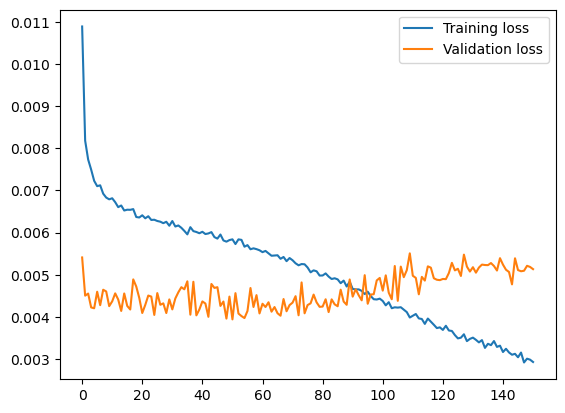

In [8]:
model_vanilla = lstm([300], n_past, n_fut, xt.shape[2],'relu', 0)    
early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=100,               
                                   restore_best_weights=True)
history = model_vanilla.fit(xt, 
                    yt, 
                    epochs=10000, 
                    batch_size=64, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))

rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

In [9]:
salvar(model_vanilla, 'LSTM_24t_300u_3f_ITVUAZD.h5')

Modelo salvo!


### Camada oculta

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 24, 100)           41600     
                                                                 
 lstm_2 (LSTM)               (None, 50)                30200     
                                                                 
 dense_1 (Dense)             (None, 3)                 153       
                                                                 
Total params: 71,953
Trainable params: 71,953
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/1000
99/99 [==============================] - 19s 182ms/step - loss: 0.0168 - val_loss: 0.0075
Epoch 2/1000
99/99 [==============================] - 17s 170ms/step - loss: 0.0104 - val_loss: 0.0059
Epoch 3/1000
99/99 [==============================] - 17s 168ms/step - loss: 0.0095 - val_loss: 0.0056


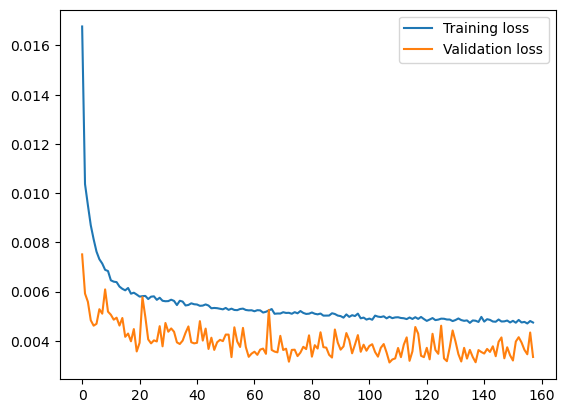

In [12]:
model = lstm([100,50], n_past, n_fut, 3,'relu',1)
#import tensorflow as tf
#model = tf.keras.models.load_model('my_model.keras')

early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=50,               
                                   restore_best_weights=True) 
    
history = model.fit(xt, 
                    yt, 
                    epochs=1000, 
                    batch_size=64, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))
    
rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

47/47 [==============================] - 1s 17ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.05213748291440983 
Vies: -0.1014214324097602 
Correlação: 0.7420780076697981 
Intercept: 0.0344295801356537 
Skill Score: 0.009027360721376665 
#Previsões: 1486 
RMSE Persistencia: 0.05261243433760514 



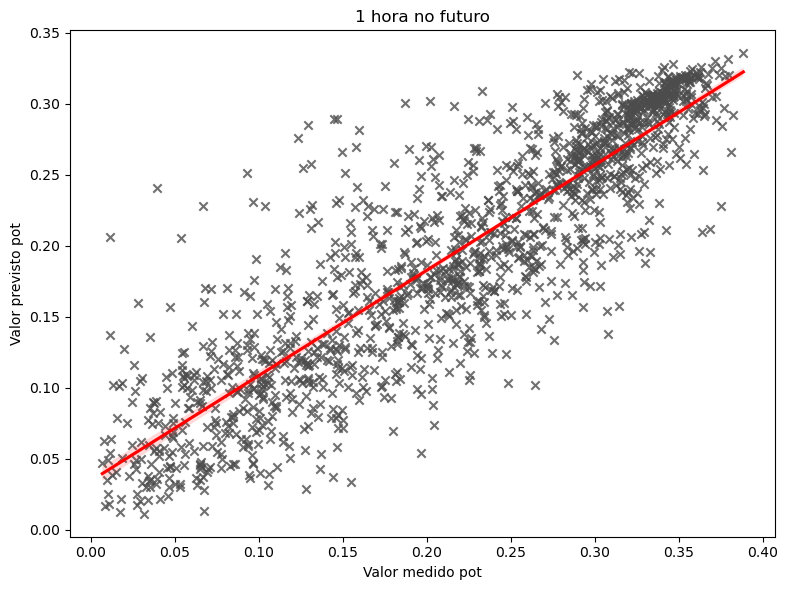

   --- Hora 2 Futuro ---   
RMSE: 0.05661889163112297 
Vies: -0.03588911495149203 
Correlação: 0.7457499730946882 
Intercept: 0.046688002210193036 
Skill Score: 0.2699613783058571 
#Previsões: 1406 
RMSE Persistencia: 0.07755602230979504 



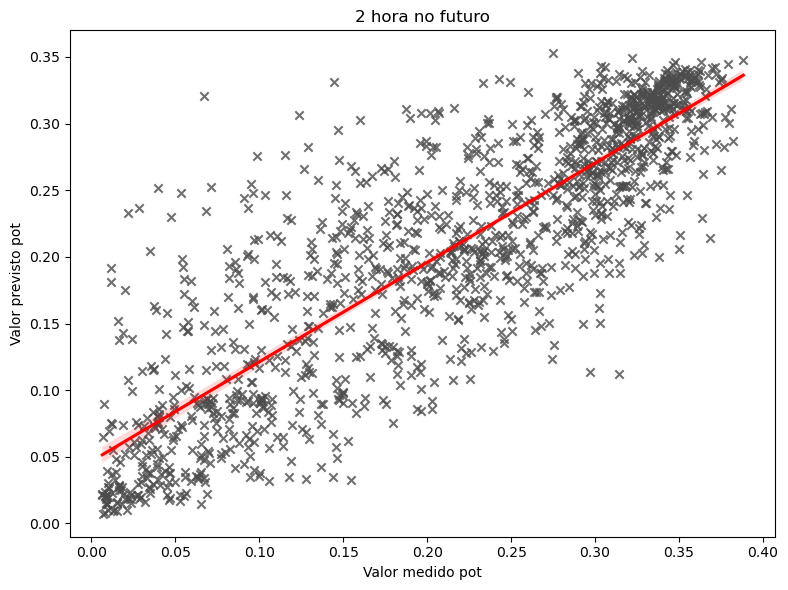

   --- Hora 3 Futuro ---   
RMSE: 0.06068085905778503 
Vies: -0.011462273415786053 
Correlação: 0.7518566429896633 
Intercept: 0.05014591618543632 
Skill Score: 0.3627232341261639 
#Previsões: 1238 
RMSE Persistencia: 0.095219004218017 



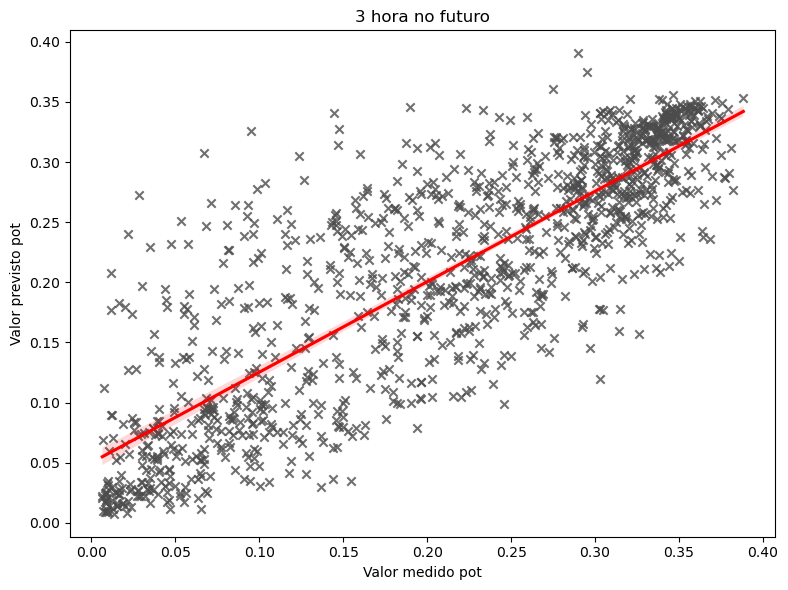

In [16]:
k= avaliacao(model, xs, ys, ysi, df[['P1','P2','P3']])

In [24]:
k.head(24)

,Previsao_1,Previsao_2,Previsao_3,Observado
Date_Time,,,,
2021-01-17 08:00:00,0.159011,NaN,NaN,0.223947
2021-01-17 09:00:00,0.247380,0.223207,NaN,0.241425
2021-01-17 10:00:00,0.254610,0.286370,0.273410,0.311055
2021-01-17 11:00:00,0.285116,0.269779,0.310870,0.327961
2021-01-17 12:00:00,0.291691,0.281256,0.277846,0.292248
2021-01-17 13:00:00,0.260379,0.273993,0.268808,0.325165
2021-01-17 14:00:00,0.244826,0.232350,0.245848,0.297208
2021-01-17 15:00:00,0.201297,0.189433,0.192481,0.314613
2021-01-17 16:00:00,0.166658,0.123502,0.123589,0.183028


### DEcoder Encoder

<Axes: xlabel='Date_Time'>

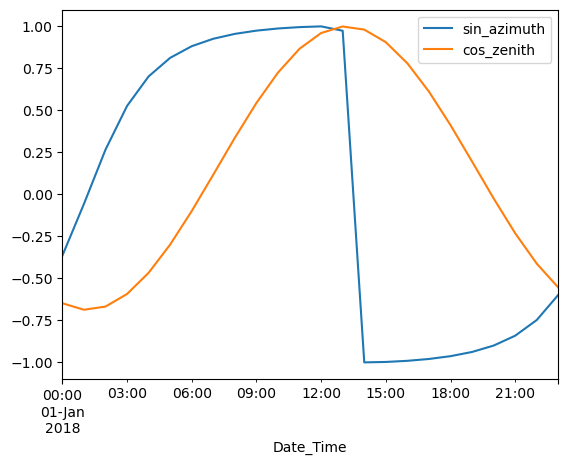

In [20]:
df[['sin_azimuth','cos_zenith']].head(24).plot()

In [21]:
n_past, n_fut = 24,12
input_tag = ['Pot_BT', 'cos_zenith', 'sin_azimuth']
#input_tag = ['Pot_BT', 'cos_zenith', 'Temperatura ambiente °C',
#            'Velocidade média do vento m/s','Umidade Relativa %','sin_azimuth','Degradacao']
#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut, input_tag)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut, input_tag)
#teste
#xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut, input_tag)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 300)               364800    
                                                                 
 repeat_vector_3 (RepeatVect  (None, 12, 300)          0         
 or)                                                             
                                                                 
 lstm_7 (LSTM)               (None, 12, 300)           721200    
                                                                 
 time_distributed_6 (TimeDis  (None, 12, 50)           15050     
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 12, 1)            51        
 tributed)                                                       
                                                      

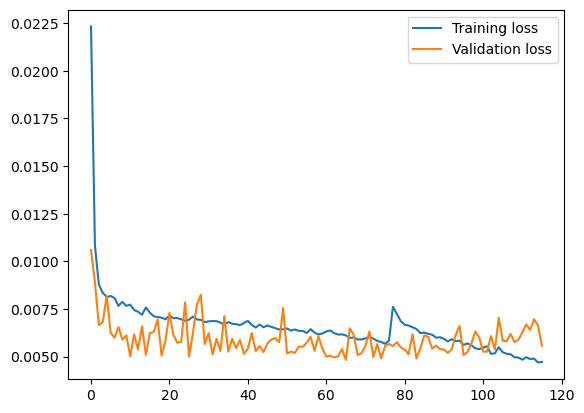

In [22]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM, Bidirectional
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from tensorflow.keras.optimizers import Adam

n_outputs = yt.shape[1]
n_input = xt.shape[2]
model = Sequential()
model.add(LSTM(300, activation='relu', input_shape=(n_past, n_input)))

#model.add(Bidirectional(LSTM(100, activation='relu', input_shape=(n_past, 3))))
model.add(RepeatVector(n_outputs))

model.add(LSTM(300, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(50, activation='relu')))

model.add(TimeDistributed(Dense(1)))

# Configure o otimizador Adam com clipping de norma
optimizer = Adam(clipnorm=1.0)

model.compile(loss='mse', optimizer=optimizer)
model.build((None, n_past, 3))
model.summary()

early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=50,               
                                   restore_best_weights=True) 
    
history = model.fit(xt, 
                    yt, 
                    epochs=10000, 
                    batch_size=64, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))
    
rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

In [23]:
salvar(model, 'EDLSTM_24t_300u_12f_PAZ.h5')

Modelo salvo!


In [ ]:
z = avaliacao_ae(model, xs, ys, ysi, df[['P1','P2','P3']])

123/123 [==============================] - 2s 16ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.04790275802688874 
Vies: -0.06792223487384685 
Correlação: 0.7959687060612158 
Intercept: 0.029702832584637268 
Skill Score: 0.10662460865765344 
#Previsões: 2691 
RMSE Persistencia: 0.05361996590807383 



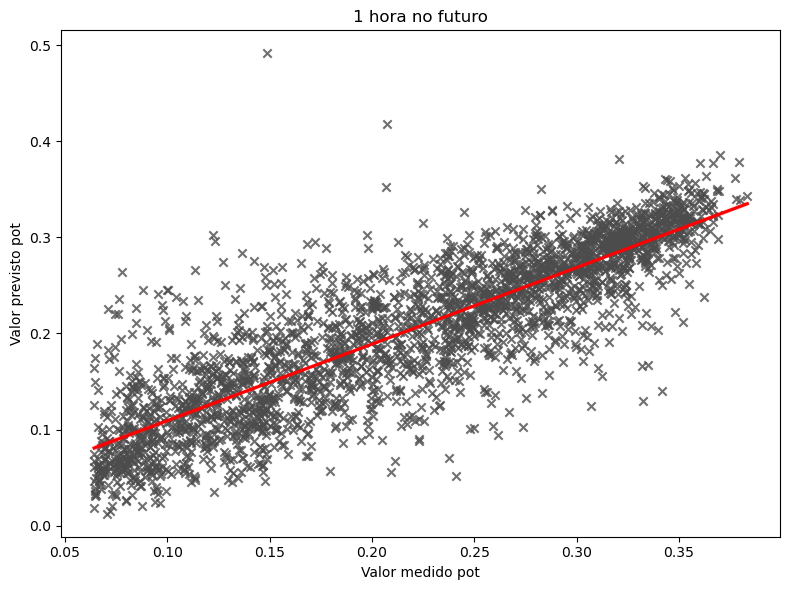

   --- Hora 2 Futuro ---   
RMSE: 0.06054506136150463 
Vies: -0.0976010689427041 
Correlação: 0.7038092076986067 
Intercept: 0.04333150344164627 
Skill Score: 0.3534582515804676 
#Previsões: 2690 
RMSE Persistencia: 0.09364447309010854 



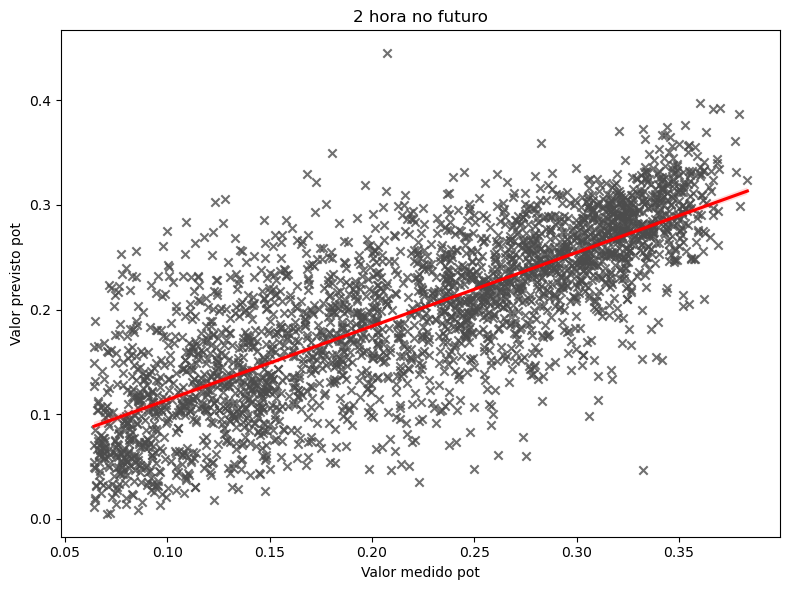

   --- Hora 3 Futuro ---   
RMSE: 0.06831408331975819 
Vies: -0.1027973372769112 
Correlação: 0.6228879891536641 
Intercept: 0.0598643132522767 
Skill Score: 0.5012014637264464 
#Previsões: 2684 
RMSE Persistencia: 0.13695726501148558 



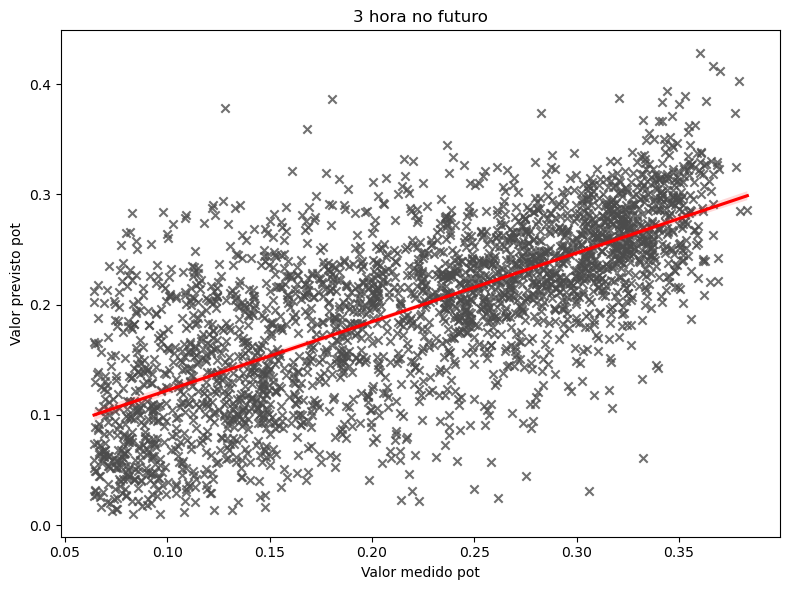

In [12]:
z = avaliacao_ae(model, xs, ys, ysi, df[['P1','P2','P3']])

In [13]:
salvar(model, 'EDLSTM_48t_300u_3f_PAZTVUD.h5')

Modelo salvo!


## Teste Irrad, vento, umidade, angulos e temperatura

In [22]:
n_past, n_fut = 48,3

input_tag = ['Irradiação Global horária(Inclinada 27°) kWh/m2',
             'cos_zenith','sin_azimuth', 'Degradacao',
             'Velocidade média do vento m/s','Umidade Relativa %',
             'Temperatura ambiente °C']
#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut, input_tag)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut, input_tag)
#teste
xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut, input_tag)

### LSTM básica 

2024-06-28 16:23:21.633063: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-28 16:23:21.676379: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-28 16:23:21.676441: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-28 16:23:21.677468: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 200)               166400    
                                                                 
 dense (Dense)               (None, 3)                 603       
                                                                 
Total params: 167,003
Trainable params: 167,003
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/1000
  2/109 [..............................] - ETA: 8s - loss: 0.0564  

2024-06-28 16:23:24.537961: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


109/109 [==============================] - 9s 71ms/step - loss: 0.0129 - val_loss: 0.0059
Epoch 2/1000
109/109 [==============================] - 10s 97ms/step - loss: 0.0099 - val_loss: 0.0052
Epoch 3/1000
109/109 [==============================] - 10s 91ms/step - loss: 0.0091 - val_loss: 0.0052
Epoch 4/1000
109/109 [==============================] - 9s 84ms/step - loss: 0.0087 - val_loss: 0.0058
Epoch 5/1000
109/109 [==============================] - 8s 76ms/step - loss: 0.0086 - val_loss: 0.0049
Epoch 6/1000
109/109 [==============================] - 8s 76ms/step - loss: 0.0083 - val_loss: 0.0060
Epoch 7/1000
109/109 [==============================] - 8s 76ms/step - loss: 0.0082 - val_loss: 0.0053
Epoch 8/1000
109/109 [==============================] - 8s 75ms/step - loss: 0.0081 - val_loss: 0.0062
Epoch 9/1000
109/109 [==============================] - 8s 74ms/step - loss: 0.0080 - val_loss: 0.0052
Epoch 10/1000
109/109 [==============================] - 8s 75ms/step - loss: 0.0080

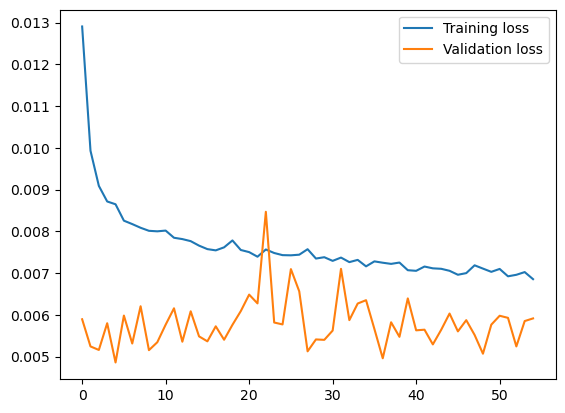

In [23]:
model_vanilla = lstm([200], n_past, n_fut, 7,'relu', 0)    
early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=50,               
                                   restore_best_weights=True)
history = model_vanilla.fit(xt, 
                    yt, 
                    epochs=1000, 
                    batch_size=64, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))

rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

79/79 [==============================] - 2s 19ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.07200183798724878 
Vies: -0.1140023513469975 
Correlação: 0.5003258263349376 
Intercept: 0.08165924961197023 
Skill Score: -0.47027497685815156 
#Previsões: 2466 
RMSE Persistencia: 0.04897168157014437 



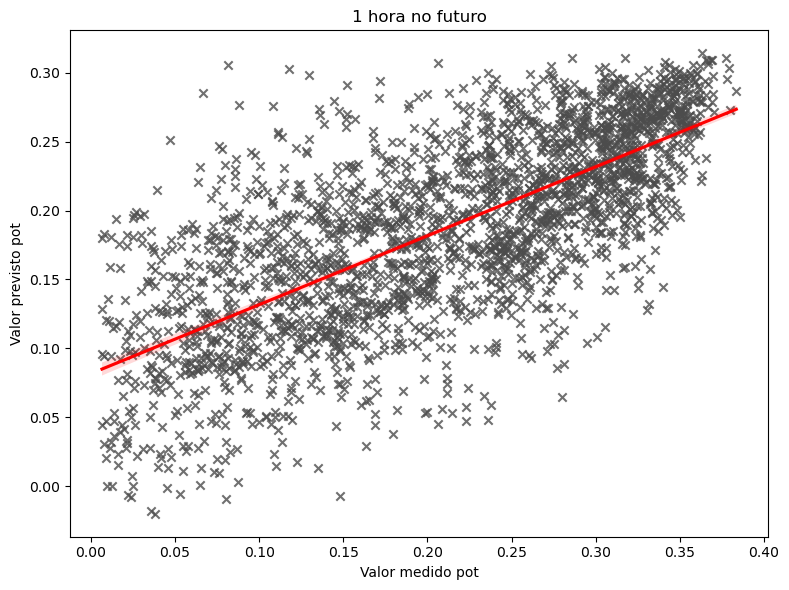

   --- Hora 2 Futuro ---   
RMSE: 0.0787151672145741 
Vies: -0.16533114080248826 
Correlação: 0.5337304999104886 
Intercept: 0.06271453659473046 
Skill Score: -0.13126251350141493 
#Previsões: 2412 
RMSE Persistencia: 0.06958169856697514 



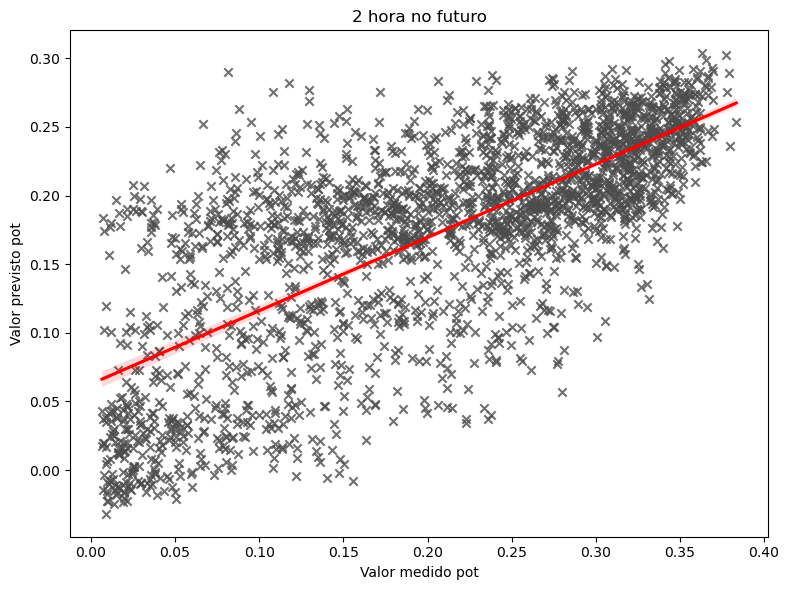

   --- Hora 3 Futuro ---   
RMSE: 0.08755477461766954 
Vies: -0.238437742749667 
Correlação: 0.5671753888508375 
Intercept: 0.03978866035266522 
Skill Score: -0.040935735143390994 
#Previsões: 2207 
RMSE Persistencia: 0.08411160426307075 



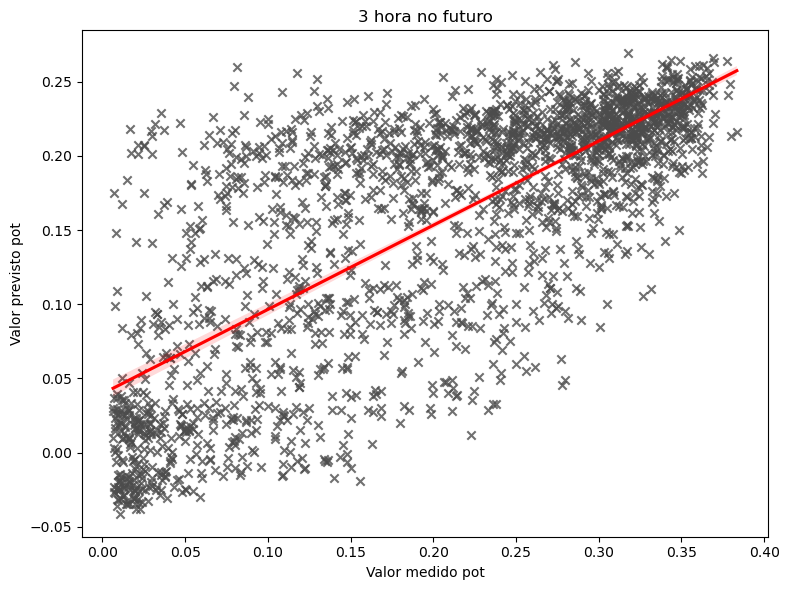

In [28]:
k= avaliacao(model_vanilla, xs, ys, ysi, df[['P1','P2','P3']])

44/44 [==============================] - 1s 16ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.06251667937079758 
Vies: -0.17678577536904944 
Correlação: 0.6831745819912024 
Intercept: 0.030925752716593202 
Skill Score: -0.2006062024672972 
#Previsões: 1380 
RMSE Persistencia: 0.05207092820470453 



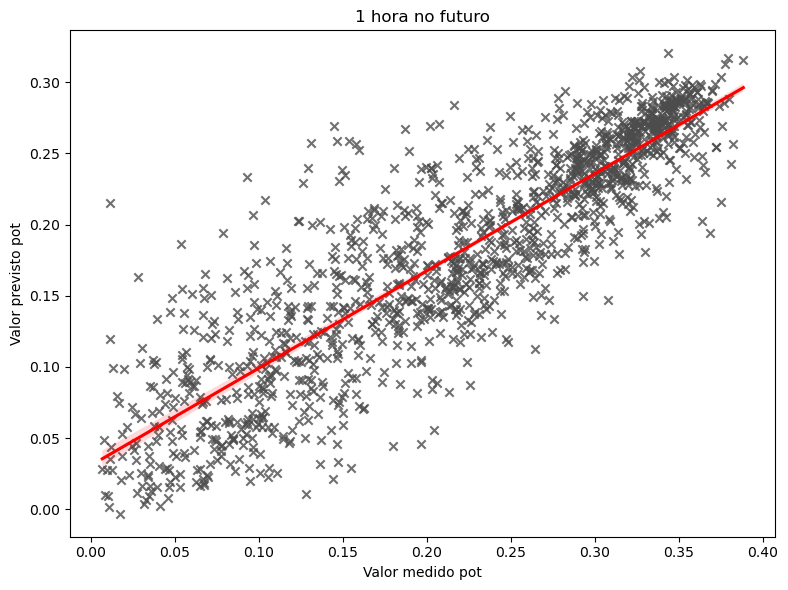

   --- Hora 2 Futuro ---   
RMSE: 0.0667949663615039 
Vies: -0.15349840413582508 
Correlação: 0.7084294838684554 
Intercept: 0.02961493462957393 
Skill Score: 0.12828540285631196 
#Previsões: 1306 
RMSE Persistencia: 0.07662481112553152 



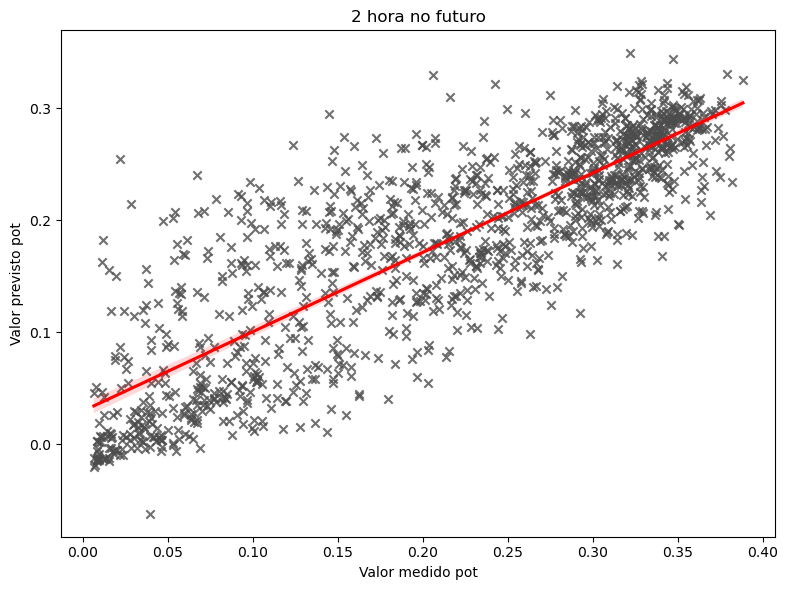

   --- Hora 3 Futuro ---   
RMSE: 0.07028125327807963 
Vies: -0.14762377888807 
Correlação: 0.7040377713598047 
Intercept: 0.03150979452044128 
Skill Score: 0.2576675667678411 
#Previsões: 1150 
RMSE Persistencia: 0.09467625302598047 



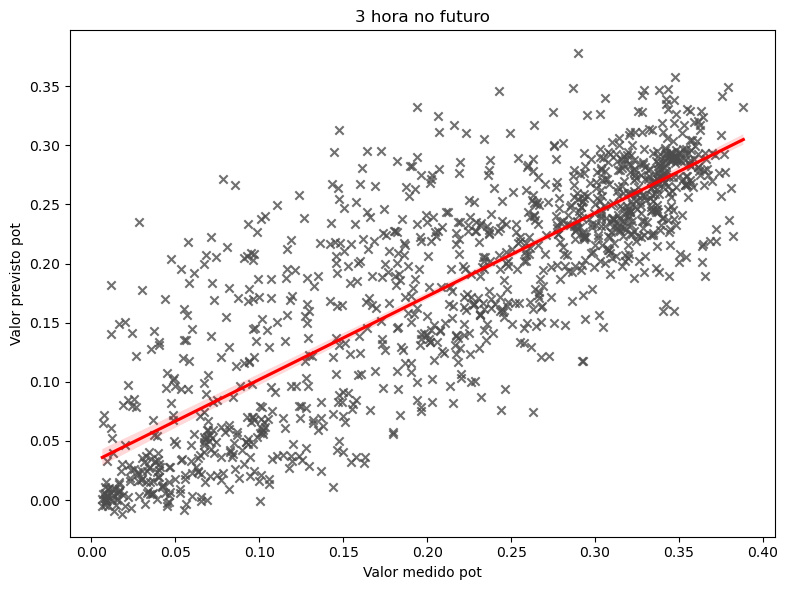

In [24]:
k= avaliacao(model_vanilla, xs, ys, ysi, df[['P1','P2','P3']])

79/79 [==============================] - 15s 182ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.06615807521666725 
Vies: 0.035502872175148116 
Correlação: 0.5966211365763441 
Intercept: 0.09292551626403525 
Skill Score: -0.3509455484371313 
#Previsões: 2466 
RMSE Persistencia: 0.04897168157014437 



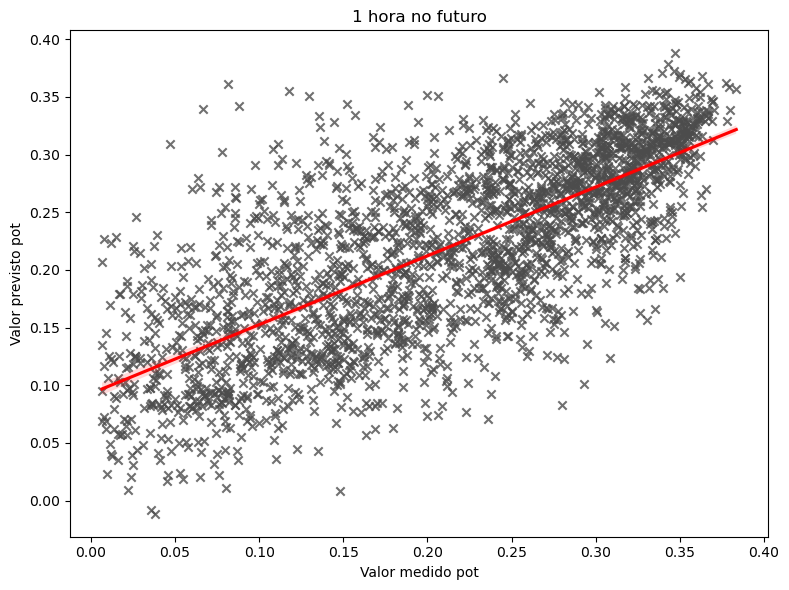

   --- Hora 2 Futuro ---   
RMSE: 0.07037679929378333 
Vies: 0.017306043296951738 
Correlação: 0.6453062045383163 
Intercept: 0.07752350865584148 
Skill Score: -0.011426865730259195 
#Previsões: 2412 
RMSE Persistencia: 0.06958169856697514 



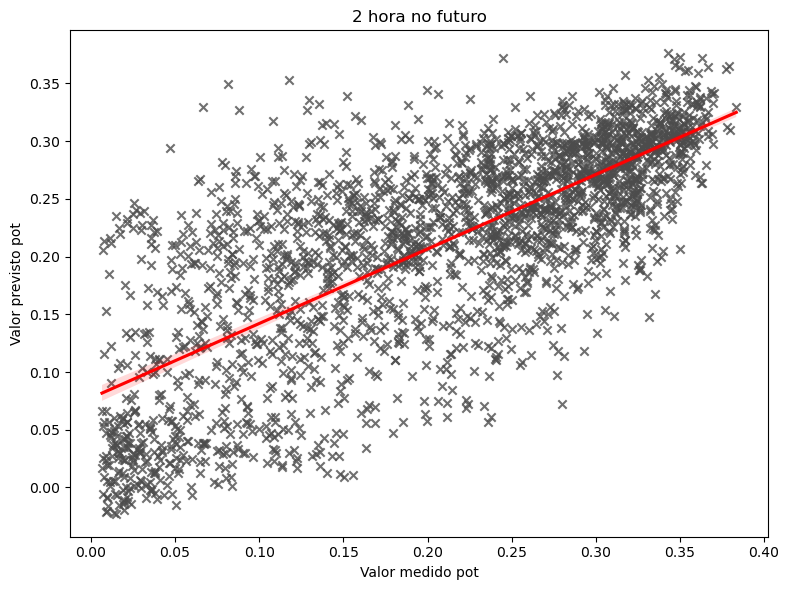

   --- Hora 3 Futuro ---   
RMSE: 0.07159421584582704 
Vies: 0.02226805472173261 
Correlação: 0.6617938222173215 
Intercept: 0.07378475161979056 
Skill Score: 0.1488188048119239 
#Previsões: 2207 
RMSE Persistencia: 0.08411160426307075 



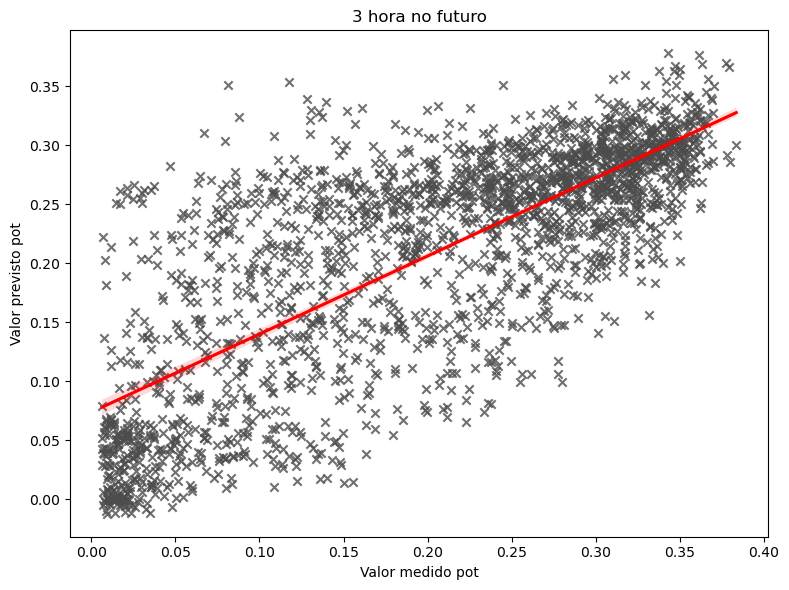

In [11]:
k= avaliacao(model_vanilla, xs, ys, ysi, df[['P1','P2','P3']])

47/47 [==============================] - 1s 10ms/step
  ===Meses Chuvosos===   
   --- Hora 1 Futuro ---   
RMSE: 0.055733016422198106 
Vies: -0.08160901479122665 
Correlação: 0.7181009591477021 
Intercept: 0.041730231366343795 
Skill Score: -0.010125659199370363 
#Previsões: 801 
RMSE Persistencia: 0.05517433986022325 



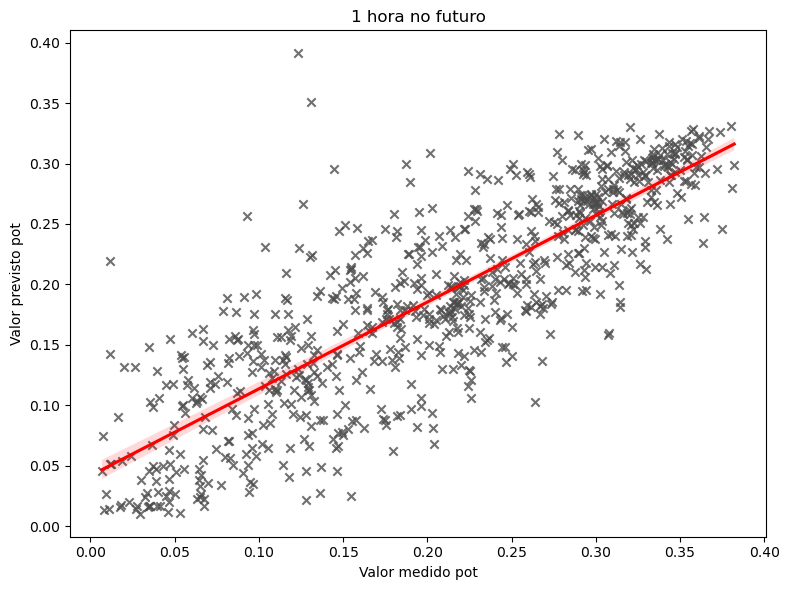

   --- Hora 2 Futuro ---   
RMSE: 0.060905221537718136 
Vies: -0.048553986627920716 
Correlação: 0.7069243319581845 
Intercept: 0.050637571986293095 
Skill Score: 0.21479912635790754 
#Previsões: 753 
RMSE Persistencia: 0.07756642100411078 



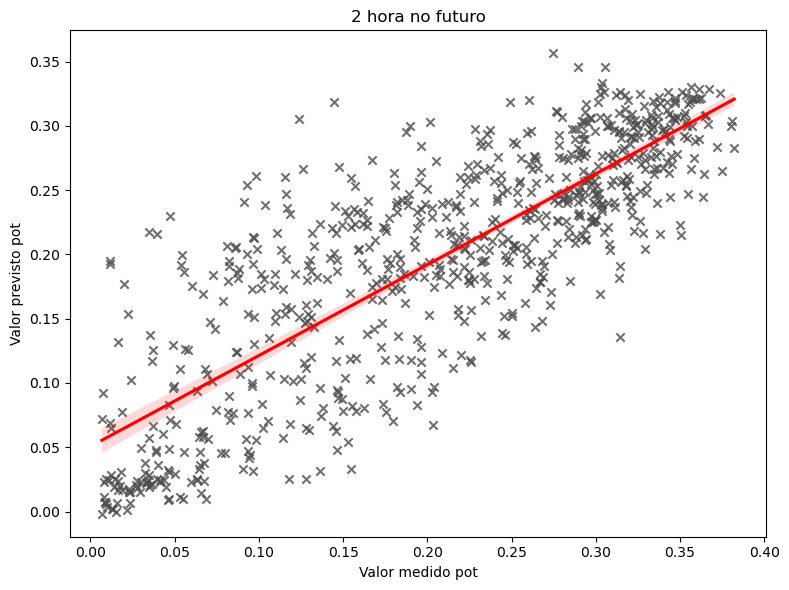

   --- Hora 3 Futuro ---   
RMSE: 0.06470087110310295 
Vies: 0.011892804707709355 
Correlação: 0.7040310459368663 
Intercept: 0.06371792922567579 
Skill Score: 0.30810005935210594 
#Previsões: 672 
RMSE Persistencia: 0.09351188994541199 



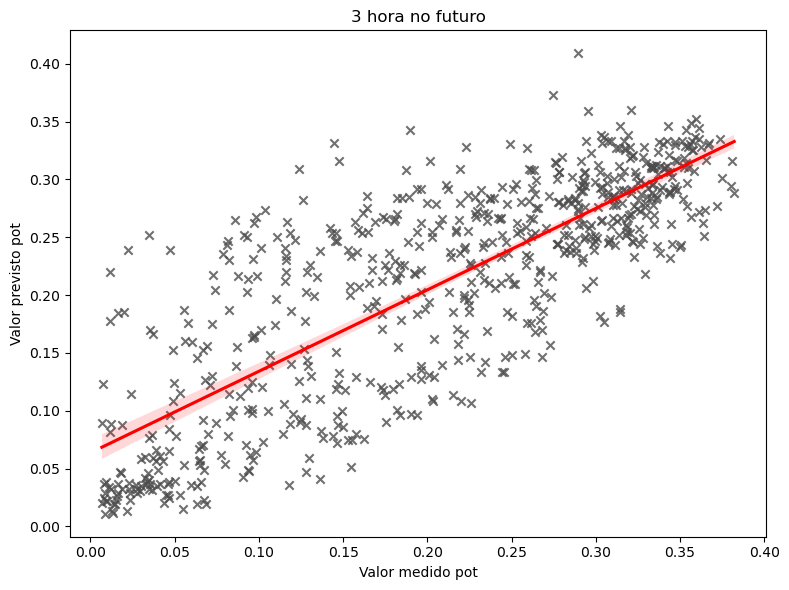

  ===Meses Secos===   
   --- Hora 1 Futuro ---   
RMSE: 0.05108531170474406 
Vies: -0.07748861285310171 
Correlação: 0.7043589257624384 
Intercept: 0.048778372074425536 
Skill Score: -0.04513525215489311 
#Previsões: 811 
RMSE Persistencia: 0.04887913942182578 



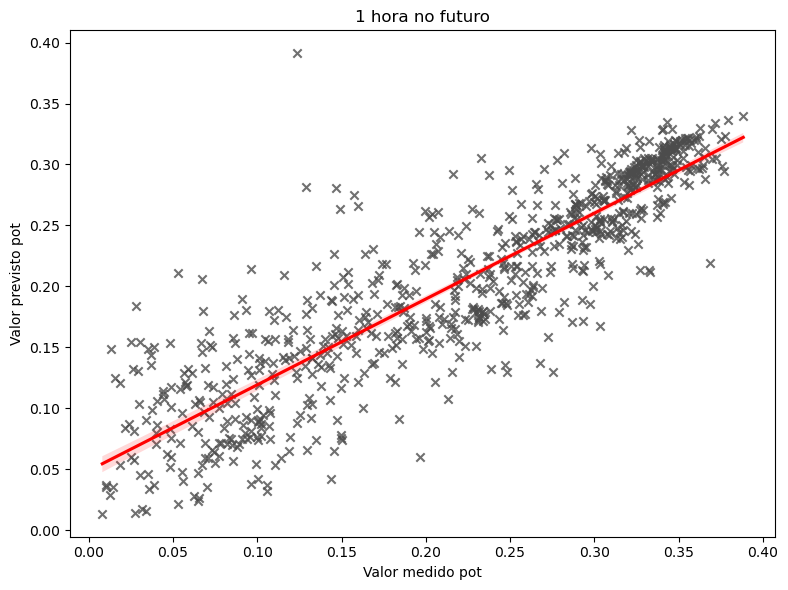

   --- Hora 2 Futuro ---   
RMSE: 0.056530751144574044 
Vies: -0.055830276334245865 
Correlação: 0.7191018612443817 
Intercept: 0.04801967076882058 
Skill Score: 0.2538113100020405 
#Previsões: 773 
RMSE Persistencia: 0.07575932455466275 



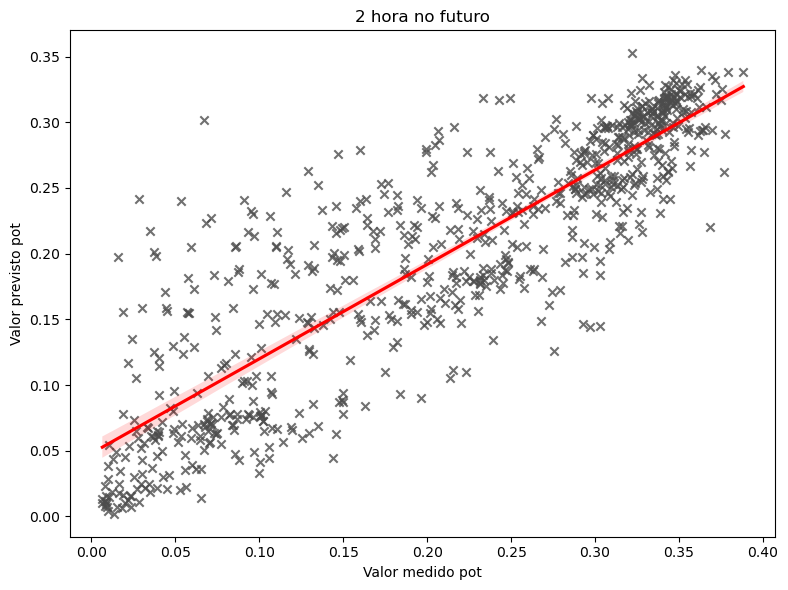

   --- Hora 3 Futuro ---   
RMSE: 0.06074287328259302 
Vies: -0.001324166776501019 
Correlação: 0.7222208263148145 
Intercept: 0.05812246983089778 
Skill Score: 0.3549182028081871 
#Previsões: 673 
RMSE Persistencia: 0.09416305582799034 



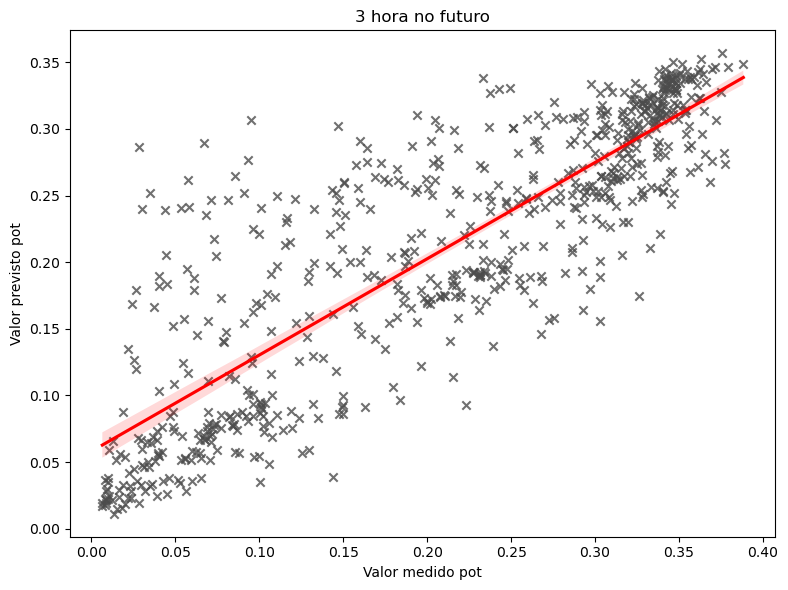

,Previsao_1,Previsao_2,Previsao_3,Observado,P1,P2,P3
Date_Time,,,,,,,
2021-01-17 08:00:00,0.180449,NaN,NaN,0.223947,0.211133,0.456473,0.000000
2021-01-17 09:00:00,0.259136,0.241685,NaN,0.241425,0.317268,0.299115,0.646690
2021-01-17 10:00:00,0.259408,0.296494,0.285392,0.311055,0.293523,0.385732,0.363662
2021-01-17 11:00:00,0.292663,0.278551,0.319450,0.327961,0.340278,0.321099,0.421971
2021-01-17 12:00:00,0.294490,0.289500,0.290021,0.292248,0.344155,0.357080,0.336955
...,...,...,...,...,...,...,...
2021-12-31 15:00:00,0.062482,0.089685,0.117144,0.006058,0.030508,0.069681,0.114188
2021-12-31 16:00:00,0.038905,0.048555,0.065583,0.046365,0.004739,0.023863,0.054504
2021-12-31 17:00:00,0.013903,0.024408,0.034173,0.010732,0.029939,0.003060,0.015409


In [17]:
avaliacao_chuva_seco(model_vanilla, xs, ys, ysi, df[['P1','P2','P3']])

In [51]:
salvar(model, 'LSTM_vanila_24t_100u_3f.h5')

Modelo salvo!


### Encoder Decoder

In [7]:
n_past, n_fut = 72,3
input_tag = ['Irradiação Global horária(Inclinada 27°) kWh/m2',
             'cos_zenith','sin_azimuth', 'Degradacao',
             'Velocidade média do vento m/s','Umidade Relativa %',
             'Temperatura ambiente °C']
#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut, input_tag)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut, input_tag)
#teste
#xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut, input_tag)

2024-07-13 18:02:33.967749: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.


2024-07-13 18:02:34.015632: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-13 18:02:34.015710: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-13 18:02:34.022404: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-13 18:02:34.023426: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built witho

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 200)               166400    
                                                                 
 repeat_vector (RepeatVector  (None, 3, 200)           0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 3, 200)            320800    
                                                                 
 time_distributed (TimeDistr  (None, 3, 50)            10050     
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 3, 1)             51        
 tributed)                                                       
                                                        

2024-07-13 18:02:35.827730: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 19825344 exceeds 10% of free system memory.
2024-07-13 18:02:35.851578: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 19825344 exceeds 10% of free system memory.
2024-07-13 18:02:38.371593: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


154/154 [==============================] - 38s 233ms/step - loss: 0.0117 - val_loss: 0.0072
Epoch 2/10000
154/154 [==============================] - 32s 211ms/step - loss: 0.0074 - val_loss: 0.0046
Epoch 3/10000
154/154 [==============================] - 33s 212ms/step - loss: 0.0069 - val_loss: 0.0041
Epoch 4/10000
154/154 [==============================] - 31s 201ms/step - loss: 0.0068 - val_loss: 0.0068
Epoch 5/10000
154/154 [==============================] - 32s 208ms/step - loss: 0.0066 - val_loss: 0.0041
Epoch 6/10000
154/154 [==============================] - 32s 207ms/step - loss: 0.0064 - val_loss: 0.0043
Epoch 7/10000
154/154 [==============================] - 32s 204ms/step - loss: 0.0064 - val_loss: 0.0062
Epoch 8/10000
154/154 [==============================] - 31s 201ms/step - loss: 0.0062 - val_loss: 0.0045
Epoch 9/10000
154/154 [==============================] - 32s 208ms/step - loss: 0.0064 - val_loss: 0.0048
Epoch 10/10000
154/154 [==============================] - 30

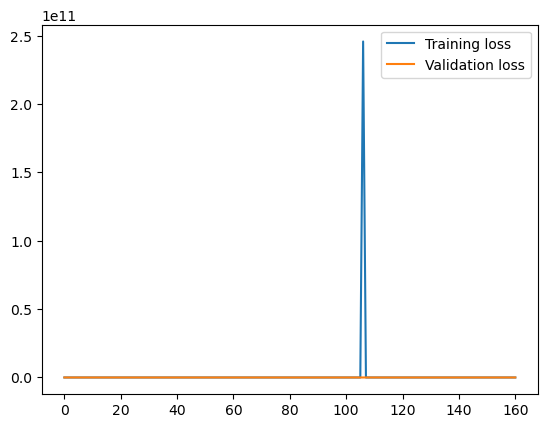

In [8]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM, Bidirectional
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from tensorflow.keras.optimizers import Adam

n_outputs = yt.shape[1]
n_input = xt.shape[2]
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(n_past, n_input)))

#model.add(Bidirectional(LSTM(100, activation='relu', input_shape=(n_past, 3))))
model.add(RepeatVector(n_outputs))

model.add(LSTM(200, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(50, activation='relu')))

model.add(TimeDistributed(Dense(1)))

# Configure o otimizador Adam com clipping de norma
optimizer = Adam(clipnorm=1.0)

model.compile(loss='mse', optimizer=optimizer)
model.build((None, n_past, 3))
model.summary()

early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=100,               
                                   restore_best_weights=True) 
    
history = model.fit(xt, 
                    yt, 
                    epochs=10000, 
                    batch_size=64, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))
    
rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

In [9]:
salvar(model, 'EDLSTM_72t_200u_3f_ITVUAZD.h5')

Modelo salvo!


79/79 [==============================] - 3s 27ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.06266526892339513 
Vies: 0.01603993233389848 
Correlação: 0.5881004901337039 
Intercept: 0.09746045740418849 
Skill Score: -0.28010437428503976 
#Previsões: 2258 
RMSE Persistencia: 0.048953249580445155 



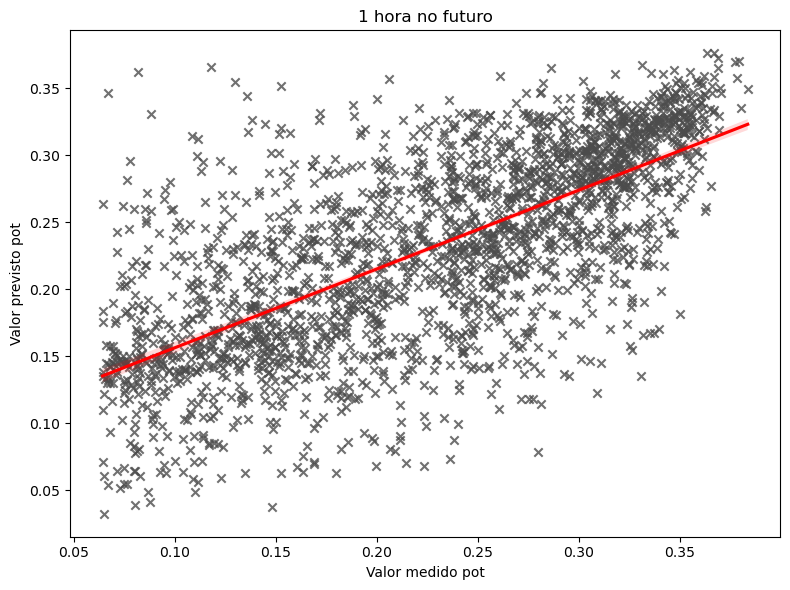

   --- Hora 2 Futuro ---   
RMSE: 0.07105395869778959 
Vies: -0.08344110893198835 
Correlação: 0.5835174656055357 
Intercept: 0.07747555858844646 
Skill Score: -0.011381433980333311 
#Previsões: 2119 
RMSE Persistencia: 0.07025436330005962 



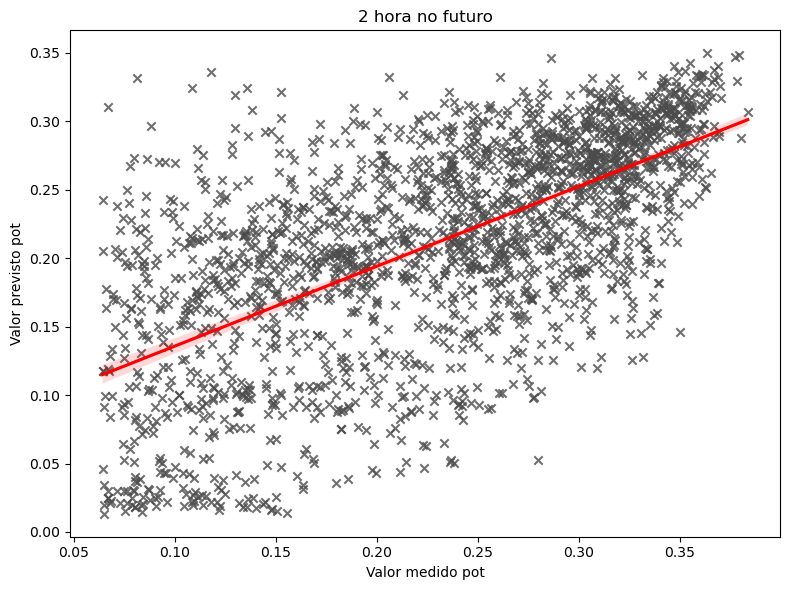

   --- Hora 3 Futuro ---   
RMSE: 0.07784915948399448 
Vies: -0.13438129576192084 
Correlação: 0.5846399465476392 
Intercept: 0.06654071949529644 
Skill Score: 0.10624391466358363 
#Previsões: 1864 
RMSE Persistencia: 0.08710336160082366 



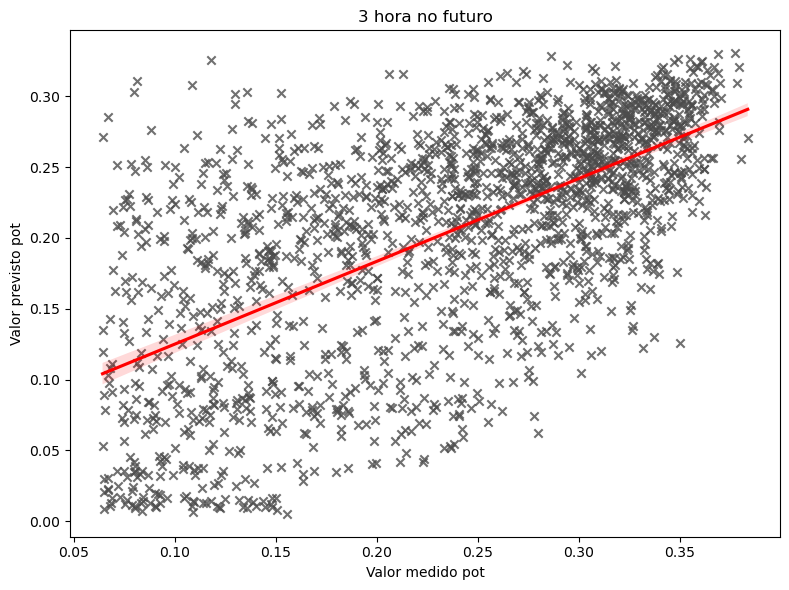

In [12]:
z = avaliacao_ae(model, xs, ys, ysi, df[['P1','P2','P3']])

79/79 [==============================] - 18s 227ms/step
  ===Meses Chuvosos===   
   --- Hora 1 Futuro ---   
RMSE: 0.06509720079808645 
Vies: 0.05645317555784684 
Correlação: 0.588137792656952 
Intercept: 0.09569143068915001 
Skill Score: -0.26555379013032 
#Previsões: 1408 
RMSE Persistencia: 0.05143771944405705 



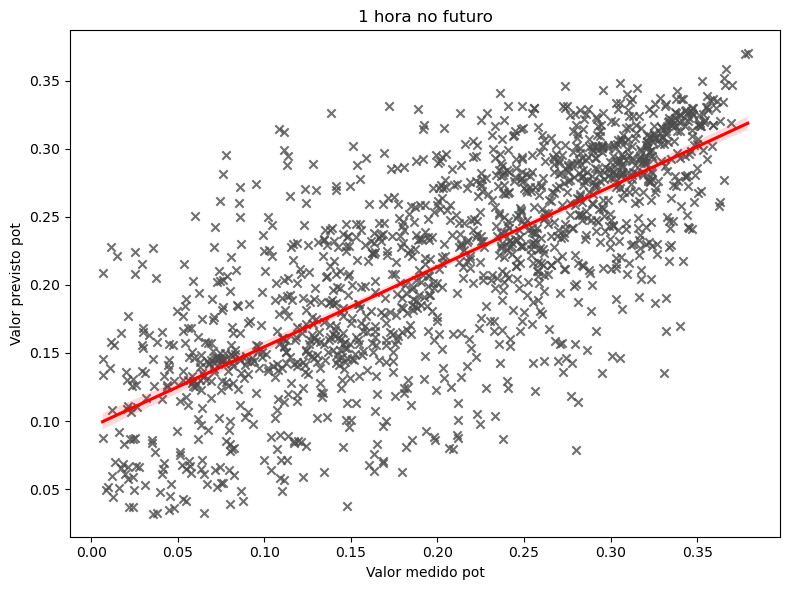

   --- Hora 2 Futuro ---   
RMSE: 0.06903526360723863 
Vies: -0.05342839127572962 
Correlação: 0.6553869783261024 
Intercept: 0.059437575889806915 
Skill Score: 0.04842596219891315 
#Previsões: 1368 
RMSE Persistencia: 0.07254849424724373 



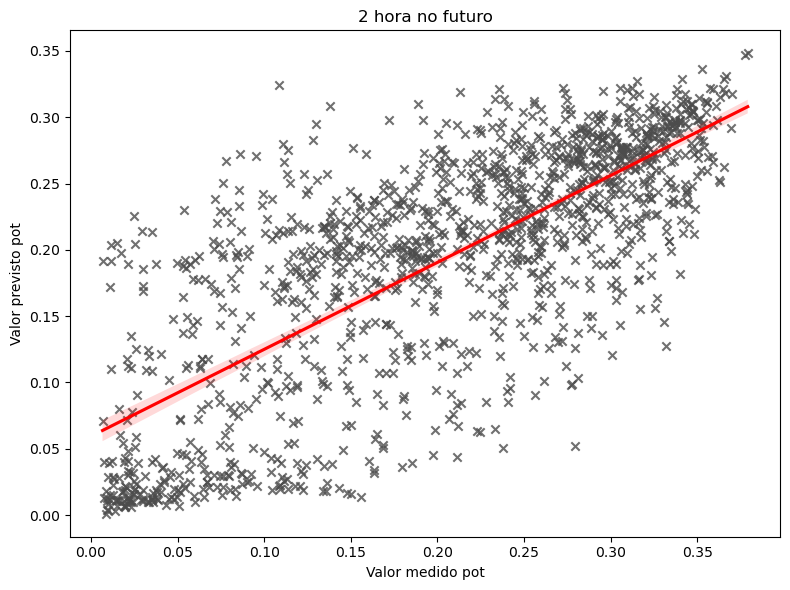

   --- Hora 3 Futuro ---   
RMSE: 0.07382810434281273 
Vies: -0.11186130412559045 
Correlação: 0.6698665816666848 
Intercept: 0.044672805107712266 
Skill Score: 0.1568291554733845 
#Previsões: 1247 
RMSE Persistencia: 0.08756007732248179 



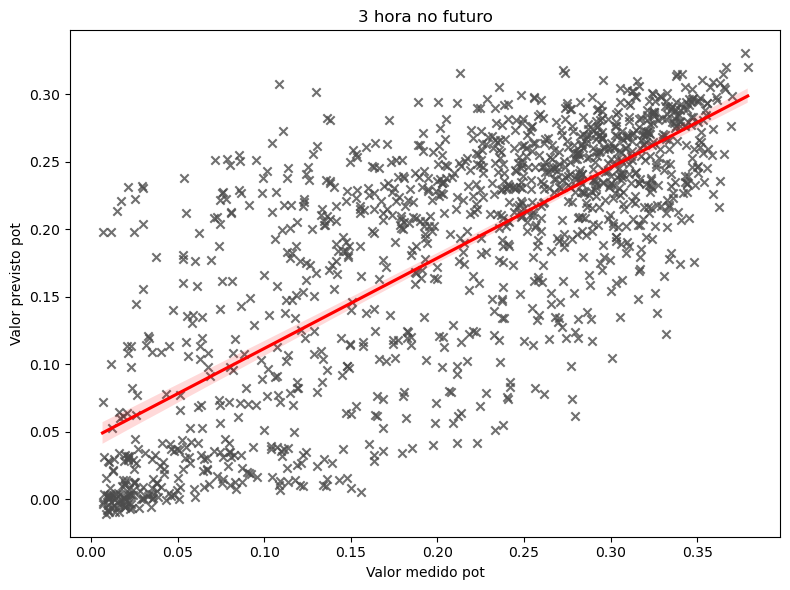

  ===Meses Secos===   
   --- Hora 1 Futuro ---   
RMSE: 0.06910171691372641 
Vies: 0.03475135316119646 
Correlação: 0.5538568187580297 
Intercept: 0.10586209805987203 
Skill Score: -0.5122069089931982 
#Previsões: 1237 
RMSE Persistencia: 0.04569594048458168 



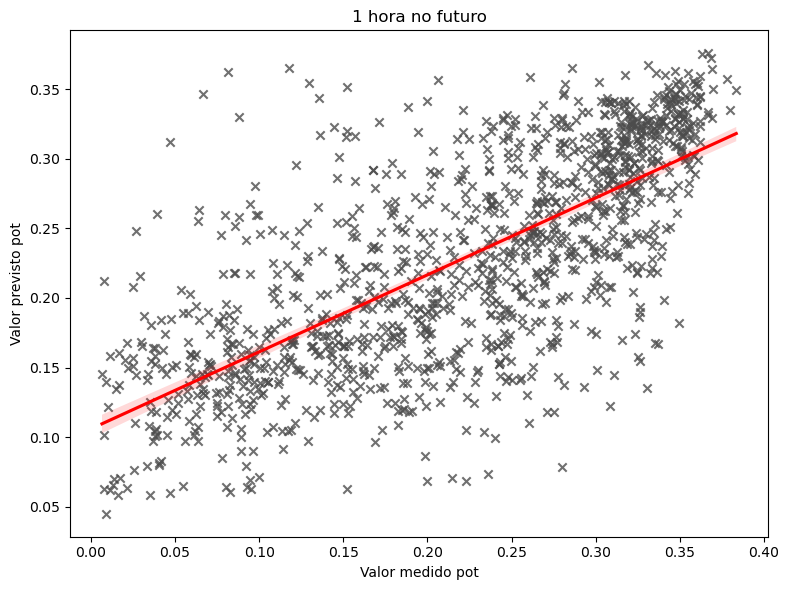

   --- Hora 2 Futuro ---   
RMSE: 0.07533571645615736 
Vies: -0.08110033467071034 
Correlação: 0.6192104494649991 
Intercept: 0.0639183914494807 
Skill Score: -0.14949977477664556 
#Previsões: 1223 
RMSE Persistencia: 0.06553782619991859 



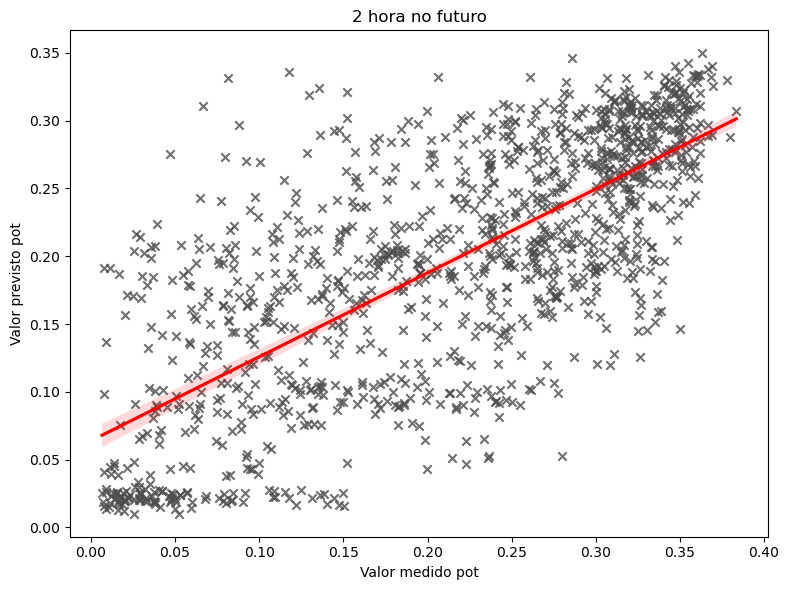

   --- Hora 3 Futuro ---   
RMSE: 0.08056643210179526 
Vies: -0.13698850614002972 
Correlação: 0.6563570033806223 
Intercept: 0.04251185888721917 
Skill Score: -0.0148474751467913 
#Previsões: 1124 
RMSE Persistencia: 0.07938772483041535 



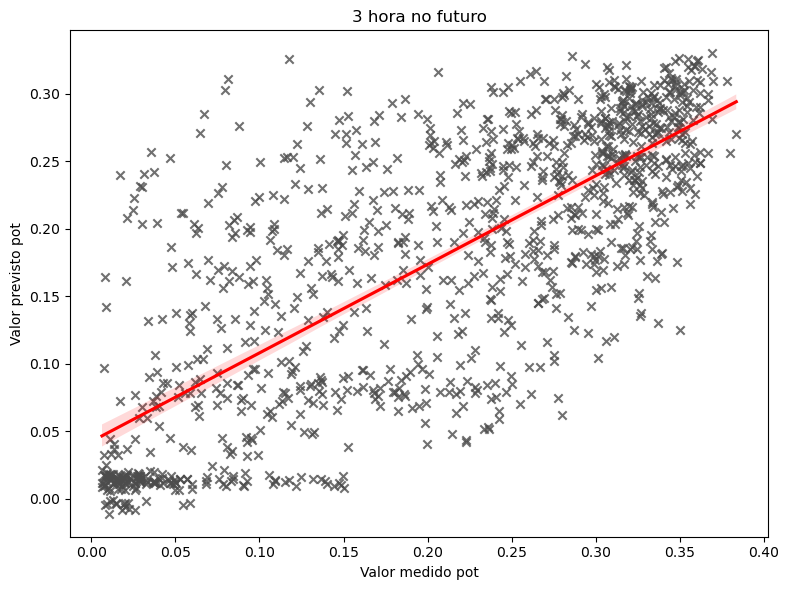

,Previsao_1,Previsao_2,Previsao_3,Observado,P1,P2,P3
Date_Time,,,,,,,
2022-01-04 08:00:00,0.165668,NaN,NaN,0.040744,0.003163,0.000000,0.000000
2022-01-04 09:00:00,0.210505,0.212785,NaN,0.100463,0.055766,0.004329,0.000000
2022-01-04 10:00:00,0.272319,0.244349,0.249570,0.149340,0.119627,0.066404,0.005155
2022-01-04 11:00:00,0.288736,0.282615,0.255957,0.128056,0.163657,0.131095,0.072770
2022-01-04 12:00:00,0.299070,0.279662,0.272480,0.111141,0.133291,0.170347,0.136454
...,...,...,...,...,...,...,...
2022-12-31 15:00:00,0.166042,0.164697,0.160537,0.053168,0.119796,0.194341,0.184230
2022-12-31 16:00:00,0.095302,0.094086,0.097145,0.148698,0.041816,0.094218,0.152847
2022-12-31 17:00:00,0.054797,0.029743,0.031221,0.076214,0.094924,0.026694,0.060146


In [13]:
avaliacao_ae_chuva_seco(model, xs, ys, ysi,df[['P1','P2','P3']])

In [38]:
salvar(model, 'LSTM_ED_48t_200u_3f_VIUTZA.h5')

Modelo salvo!


## Teste Irrad, vento, umidade, angulos 

In [22]:
def janela_flutuante(df, n_past, n_future):

    yt= []
    xt = []
    y_index = []
    #kt = []
    input_tag = ['Irradiação Global horária(Inclinada 27°) kWh/m2','cos_zenith','sin_azimuth', 
                 'Velocidade média do vento m/s','Umidade Relativa %']
    index = df.loc[(df['zenith'] < 70) & (df['Pot_BT'].isnull() == False)].index
        

        #Janela deslizante
    for i in index:
        #(np.isin(df['Pot_BT'].loc['2018-01-01 00:00:00':'2018-01-01 23:00:00'].value_counts().index,-1).sum())
        if (np.isin(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts().index, -1).sum() == 0):
            if len(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)]) == n_past:
                if df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)].isnull().sum().sum() == 0:
                    y_index.append(df.loc[i:i + datetime.timedelta(hours=n_future-1)].index)
                    # Seleção da Potencia [dia que queres prever : até que dia no futuro] 
                    yt.append(df[['Pot_BT']].loc[i:i + datetime.timedelta(hours=n_future-1)])
                    #
                    xt.append(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)])
                    #kt.append(df[['Irradiação Global horária(Inclinada 27°) kWh/m2', 'Temperatura ambiente °C']].loc[i:i + datetime.timedelta(hours=n_future-1)])

    
    xt, yt = np.array(xt), np.array(yt)
    #y_index = np.array(y_index)
    #kt = np.array(kt)
        
    #return xt, yt, kt
    return xt, yt, y_index

In [23]:
n_past, n_fut = 48,3

#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut)
#teste
xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut)

### Encoder Decoder

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 300)               367200    
                                                                 
 repeat_vector_5 (RepeatVect  (None, 3, 300)           0         
 or)                                                             
                                                                 
 lstm_11 (LSTM)              (None, 3, 300)            721200    
                                                                 
 time_distributed_10 (TimeDi  (None, 3, 100)           30100     
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, 3, 1)             101       
 stributed)                                                      
                                                      

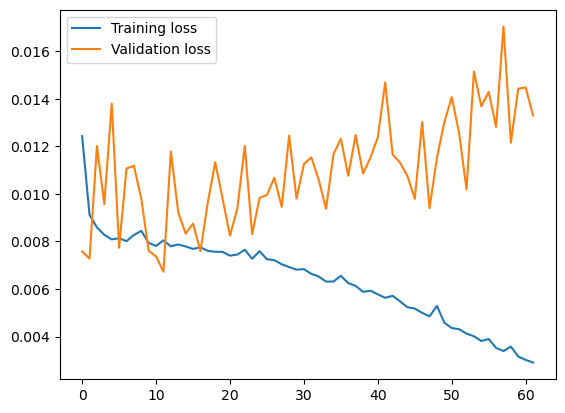

In [25]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

n_outputs = yt.shape[1]

model = Sequential()
model.add(LSTM(300, activation='relu', input_shape=(n_past, 5)))
model.add(RepeatVector(n_outputs))
model.add(LSTM(300, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(100, activation='relu')))
model.add(TimeDistributed(Dense(1)))
model.compile(loss='mse', optimizer='adam')

model.summary()

early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=50,               
                                   restore_best_weights=True) 
    
history = model.fit(xt, 
                    yt, 
                    epochs=1000, 
                    batch_size=32, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))
    
rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

44/44 [==============================] - 1s 17ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.05974287140214015 
Vies: 0.09897934220999899 
Correlação: 0.7868312535579953 
Intercept: 0.06893344212140334 
Skill Score: -0.14733640174945983 
#Previsões: 1380 
RMSE Persistencia: 0.05207092820470453 



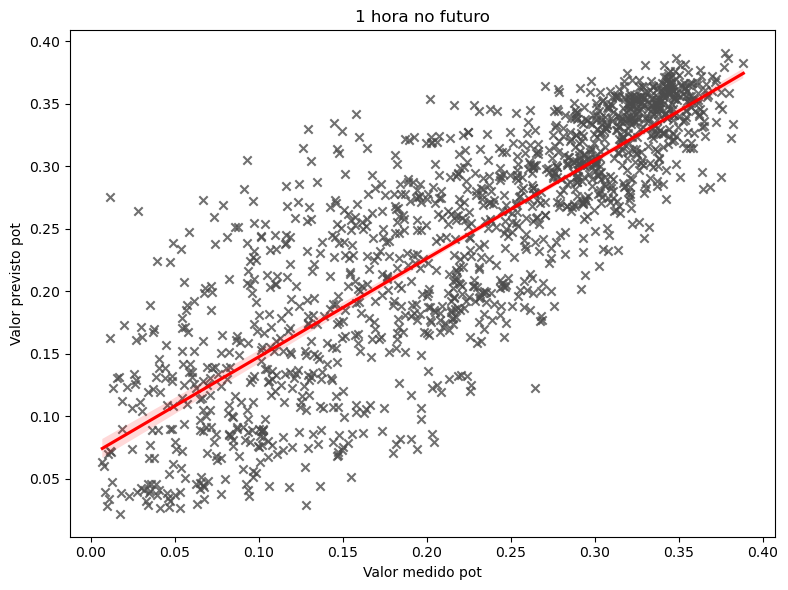

   --- Hora 2 Futuro ---   
RMSE: 0.06436081264213718 
Vies: 0.08269789567307116 
Correlação: 0.795130625700016 
Intercept: 0.0616799857607819 
Skill Score: 0.16005257700802278 
#Previsões: 1306 
RMSE Persistencia: 0.07662481112553152 



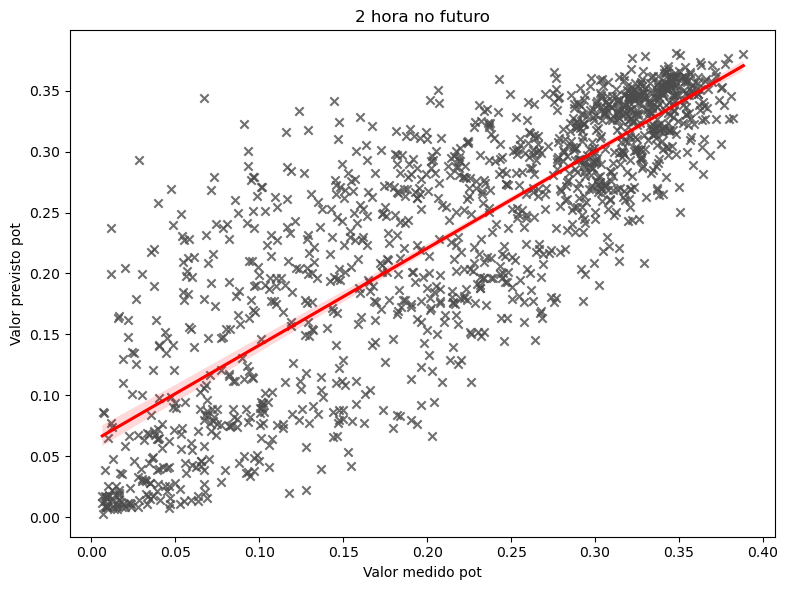

   --- Hora 3 Futuro ---   
RMSE: 0.06629517659590202 
Vies: 0.08260359352087553 
Correlação: 0.7779766473377403 
Intercept: 0.06470832407686389 
Skill Score: 0.2997697471433548 
#Previsões: 1150 
RMSE Persistencia: 0.09467625302598047 



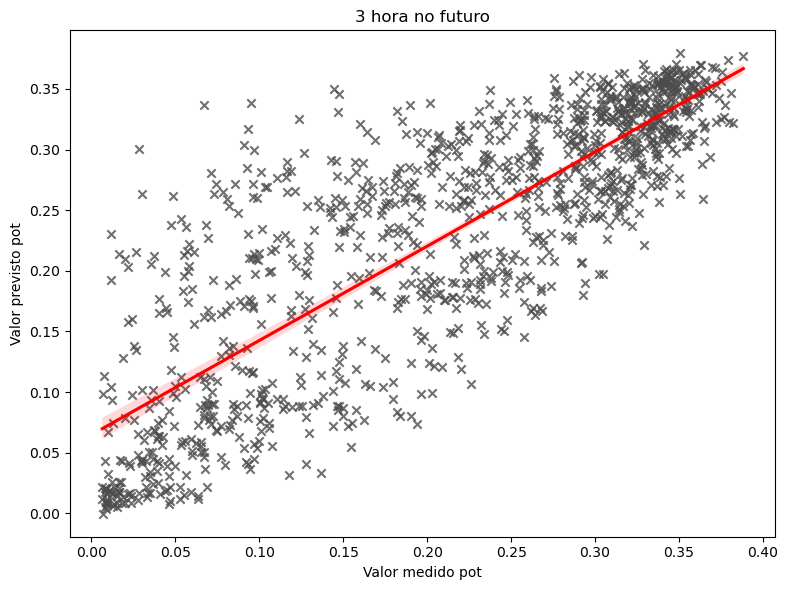

In [26]:
z = avaliacao_ae(model, xs, ys, ysi, df[['P1','P2','P3']])

44/44 [==============================] - 1s 18ms/step
  ===Meses Chuvosos===   
   --- Hora 1 Futuro ---   
RMSE: 0.06541917181268304 
Vies: 0.11071973882123196 
Correlação: 0.7676624359221882 
Intercept: 0.07152916684155089 
Skill Score: -0.18159873033569607 
#Previsões: 742 
RMSE Persistencia: 0.055364964546041145 



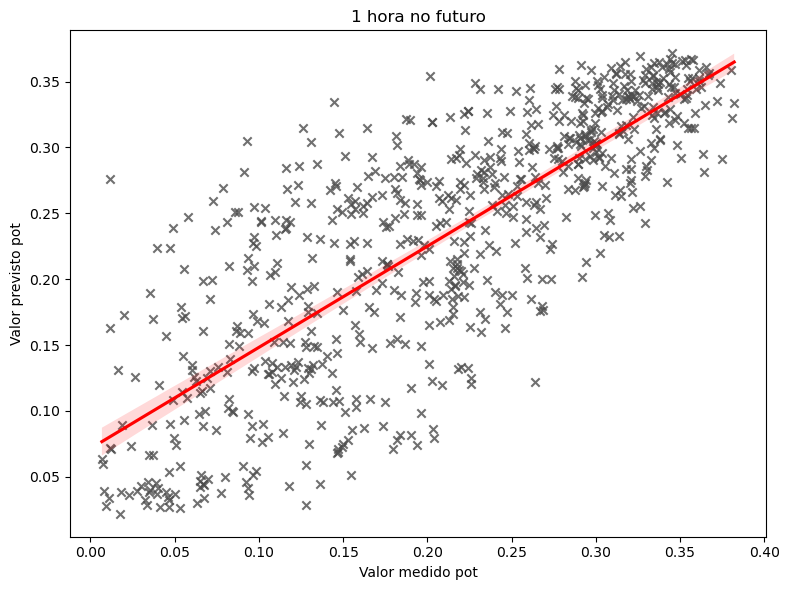

   --- Hora 2 Futuro ---   
RMSE: 0.07065325150827237 
Vies: 0.09640280358297916 
Correlação: 0.7709857251015391 
Intercept: 0.06752043278621636 
Skill Score: 0.09198051933672369 
#Previsões: 697 
RMSE Persistencia: 0.0778102816215602 



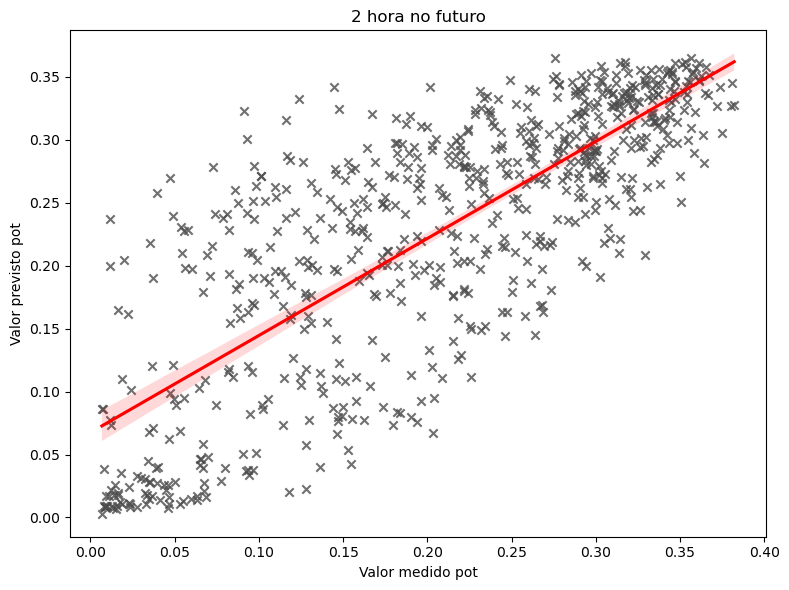

   --- Hora 3 Futuro ---   
RMSE: 0.0725935050243583 
Vies: 0.09929893632113232 
Correlação: 0.7566150660792426 
Intercept: 0.07108286668379823 
Skill Score: 0.2322499596846077 
#Previsões: 622 
RMSE Persistencia: 0.09455356719295883 



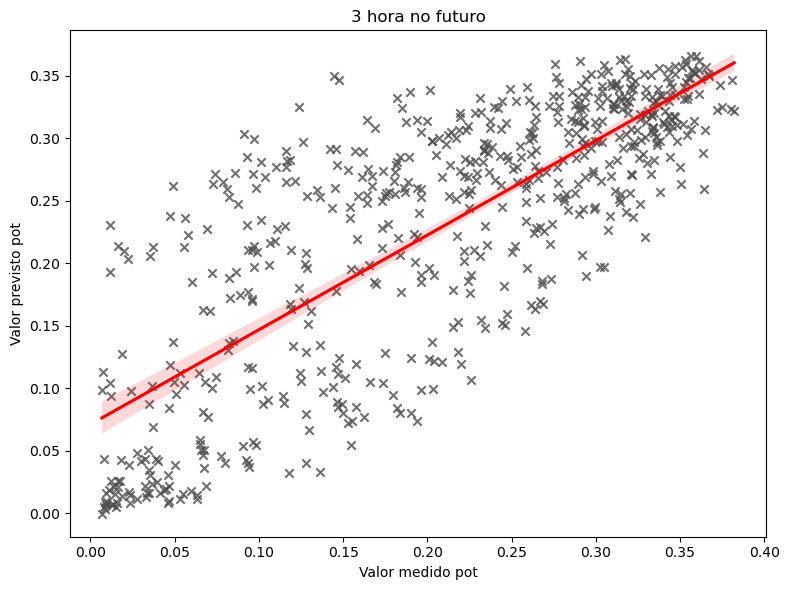

  ===Meses Secos===   
   --- Hora 1 Futuro ---   
RMSE: 0.056816518934221086 
Vies: 0.10589745732466267 
Correlação: 0.7790616586085163 
Intercept: 0.07390252547724294 
Skill Score: -0.19387257565064275 
#Previsões: 755 
RMSE Persistencia: 0.04759010307549525 



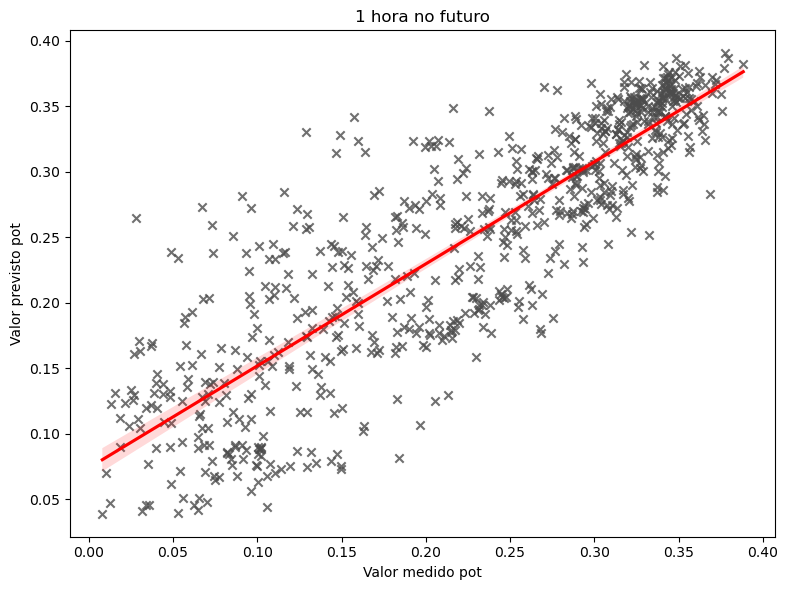

   --- Hora 2 Futuro ---   
RMSE: 0.060952178429503075 
Vies: 0.0873723728397929 
Correlação: 0.7962507479779051 
Intercept: 0.06268015336443544 
Skill Score: 0.1724952656488291 
#Previsões: 721 
RMSE Persistencia: 0.07365780025088847 



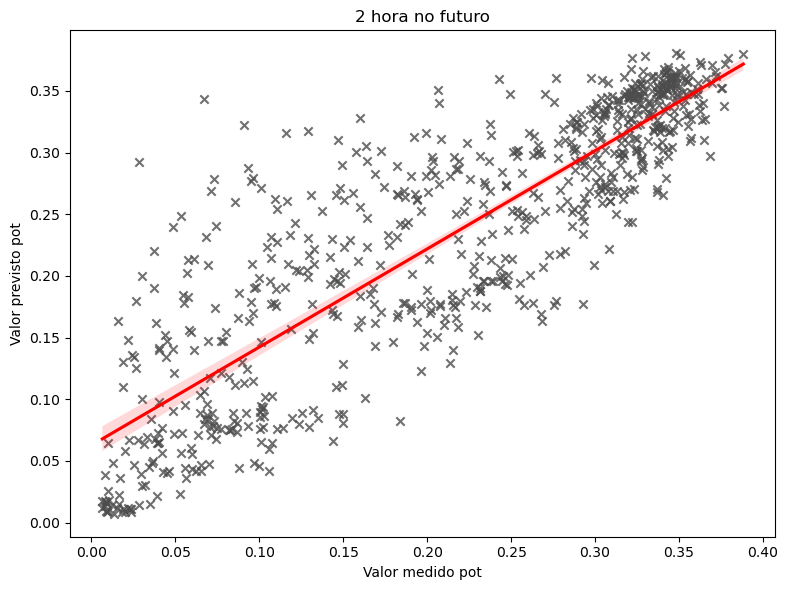

   --- Hora 3 Futuro ---   
RMSE: 0.06336790295838562 
Vies: 0.08533273174495583 
Correlação: 0.7762739352182542 
Intercept: 0.06550994667337026 
Skill Score: 0.31153796647580667 
#Previsões: 628 
RMSE Persistencia: 0.09204269788707065 



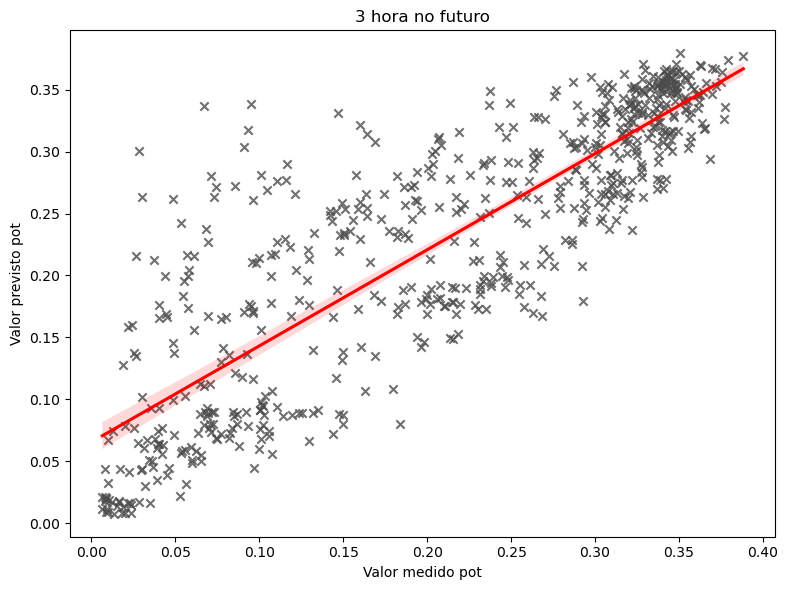

,Previsao_1,Previsao_2,Previsao_3,Observado,P1,P2,P3
Date_Time,,,,,,,
2021-01-18 08:00:00,0.198013,NaN,NaN,0.220913,0.243963,0.454431,0.000000
2021-01-18 09:00:00,0.289095,0.272891,NaN,0.254390,0.308361,0.340535,0.634316
2021-01-18 10:00:00,0.325926,0.326073,0.312506,0.299318,0.307982,0.373323,0.412275
2021-01-18 11:00:00,0.336905,0.337567,0.340276,0.320312,0.329110,0.338636,0.410480
2021-01-18 12:00:00,0.342524,0.328416,0.329682,0.252807,0.335379,0.344591,0.354565
...,...,...,...,...,...,...,...
2021-12-31 15:00:00,0.115986,0.138075,0.169966,0.006058,0.030508,0.069681,0.114188
2021-12-31 16:00:00,0.053936,0.062602,0.084087,0.046365,0.004739,0.023863,0.054504
2021-12-31 17:00:00,0.033966,0.017411,0.018321,0.010732,0.029939,0.003060,0.015409


In [27]:
avaliacao_ae_chuva_seco(model, xs, ys, ysi,df[['P1','P2','P3']])

In [30]:
salvar(model, 'LSTM_ED_48t_200u_3f_VIUZA.h5')

Modelo salvo!


## Teste Irrad, angulos

In [9]:
def janela_flutuante(df, n_past, n_future):

    yt= []
    xt = []
    y_index = []
    #kt = []
    input_tag = ['Irradiação Global horária(Inclinada 27°) kWh/m2','cos_zenith','sin_azimuth']
    index = df.loc[(df['zenith'] < 70) & (df['Pot_BT'].isnull() == False)].index
        

        #Janela deslizante
    for i in index:
        #(np.isin(df['Pot_BT'].loc['2018-01-01 00:00:00':'2018-01-01 23:00:00'].value_counts().index,-1).sum())
        if (np.isin(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts().index, -1).sum() == 0):
            if len(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)]) == n_past:
                if df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)].isnull().sum().sum() == 0:
                    y_index.append(df.loc[i:i + datetime.timedelta(hours=n_future-1)].index)
                    # Seleção da Potencia [dia que queres prever : até que dia no futuro] 
                    yt.append(df[['Pot_BT']].loc[i:i + datetime.timedelta(hours=n_future-1)])
                    #
                    xt.append(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)])
                    #kt.append(df[['Irradiação Global horária(Inclinada 27°) kWh/m2', 'Temperatura ambiente °C']].loc[i:i + datetime.timedelta(hours=n_future-1)])

    
    xt, yt = np.array(xt), np.array(yt)
    #y_index = np.array(y_index)
    #kt = np.array(kt)
        
    #return xt, yt, kt
    return xt, yt, y_index

In [10]:
n_past, n_fut = 48,3

#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut)
#teste
xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut)

### Encoder Decoder

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 200)               163200    
                                                                 
 repeat_vector_1 (RepeatVect  (None, 3, 200)           0         
 or)                                                             
                                                                 
 lstm_3 (LSTM)               (None, 3, 200)            320800    
                                                                 
 time_distributed_2 (TimeDis  (None, 3, 100)           20100     
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 3, 1)             101       
 tributed)                                                       
                                                      

2024-04-09 10:04:10.454167: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


198/198 [==============================] - 28s 132ms/step - loss: 0.0129 - val_loss: 0.0087
Epoch 2/1000
198/198 [==============================] - 25s 127ms/step - loss: 0.0090 - val_loss: 0.0110
Epoch 3/1000
198/198 [==============================] - 26s 129ms/step - loss: 0.0086 - val_loss: 0.0104
Epoch 4/1000
198/198 [==============================] - 25s 127ms/step - loss: 0.0084 - val_loss: 0.0089
Epoch 5/1000
198/198 [==============================] - 25s 128ms/step - loss: 0.0083 - val_loss: 0.0115
Epoch 6/1000
198/198 [==============================] - 25s 127ms/step - loss: 0.0082 - val_loss: 0.0081
Epoch 7/1000
198/198 [==============================] - 26s 130ms/step - loss: 0.0081 - val_loss: 0.0119
Epoch 8/1000
198/198 [==============================] - 27s 135ms/step - loss: 0.0080 - val_loss: 0.0097
Epoch 9/1000
198/198 [==============================] - 25s 125ms/step - loss: 0.0082 - val_loss: 0.0099
Epoch 10/1000
198/198 [==============================] - 24s 120ms/s

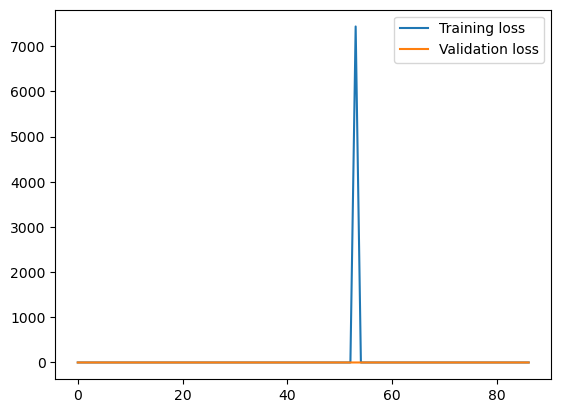

In [12]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

n_outputs = yt.shape[1]

model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(n_past, 3)))
model.add(RepeatVector(n_outputs))
model.add(LSTM(200, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(100, activation='relu')))
model.add(TimeDistributed(Dense(1)))
model.compile(loss='mse', optimizer='adam')

model.summary()

early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=50,               
                                   restore_best_weights=True) 
    
history = model.fit(xt, 
                    yt, 
                    epochs=1000, 
                    batch_size=32, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))
    
rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

44/44 [==============================] - 1s 14ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.06564392641523173 
Vies: 0.17662591439923153 
Correlação: 0.7781473229839919 
Intercept: 0.08799829925777261 
Skill Score: -0.26066365011140524 
#Previsões: 1380 
RMSE Persistencia: 0.05207092820470453 



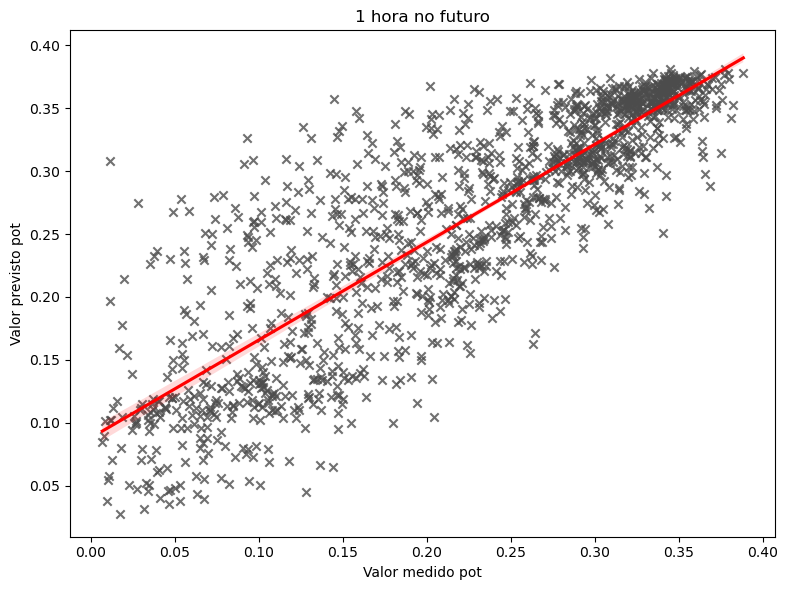

   --- Hora 2 Futuro ---   
RMSE: 0.06737176380247728 
Vies: 0.13951735156916545 
Correlação: 0.7550146425599293 
Intercept: 0.0824715608938873 
Skill Score: 0.12075784836709513 
#Previsões: 1306 
RMSE Persistencia: 0.07662481112553152 



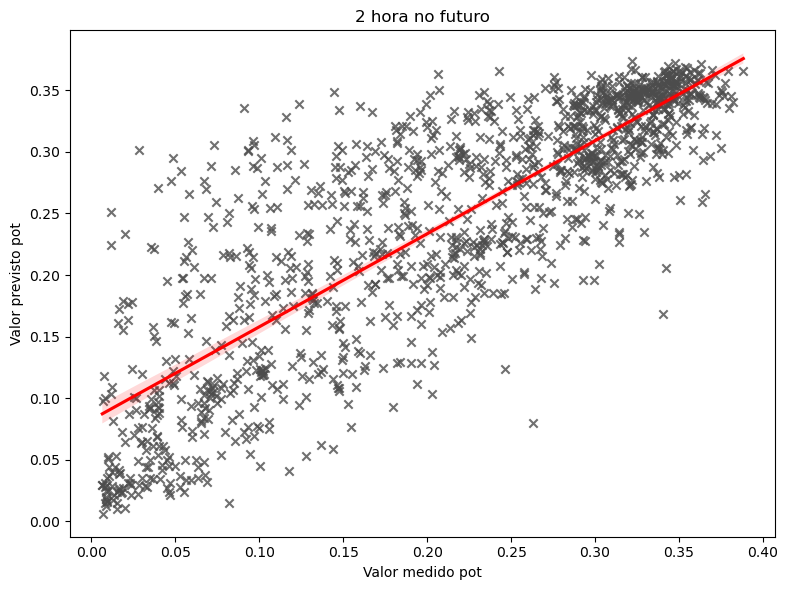

   --- Hora 3 Futuro ---   
RMSE: 0.06941955651862342 
Vies: 0.1029270719280011 
Correlação: 0.7560588457865839 
Intercept: 0.07368114301888487 
Skill Score: 0.266769075667013 
#Previsões: 1150 
RMSE Persistencia: 0.09467625302598047 



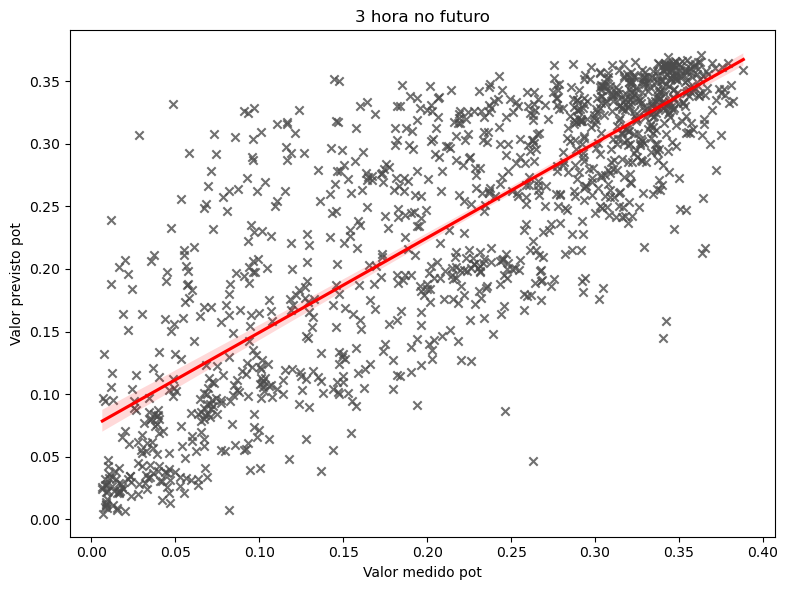

In [13]:
z = avaliacao_ae(model, xs, ys, ysi, df[['P1','P2','P3']])

44/44 [==============================] - 1s 16ms/step
  ===Meses Chuvosos===   
   --- Hora 1 Futuro ---   
RMSE: 0.07409563047432083 
Vies: 0.2100288994126061 
Correlação: 0.7474231138211407 
Intercept: 0.09645562458460899 
Skill Score: -0.3383126148794584 
#Previsões: 742 
RMSE Persistencia: 0.055364964546041145 



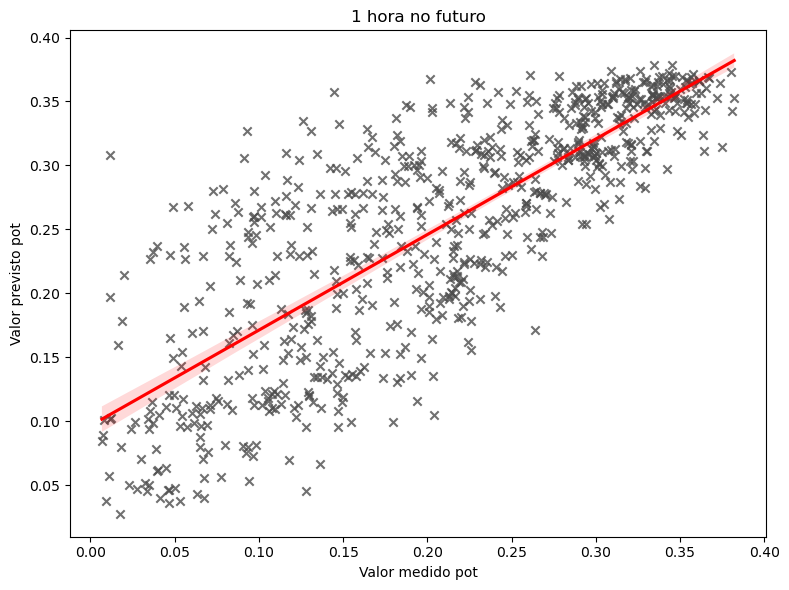

   --- Hora 2 Futuro ---   
RMSE: 0.07564270827227397 
Vies: 0.17439084335465652 
Correlação: 0.705390190710447 
Intercept: 0.09731243114629914 
Skill Score: 0.027857158515740776 
#Previsões: 697 
RMSE Persistencia: 0.0778102816215602 



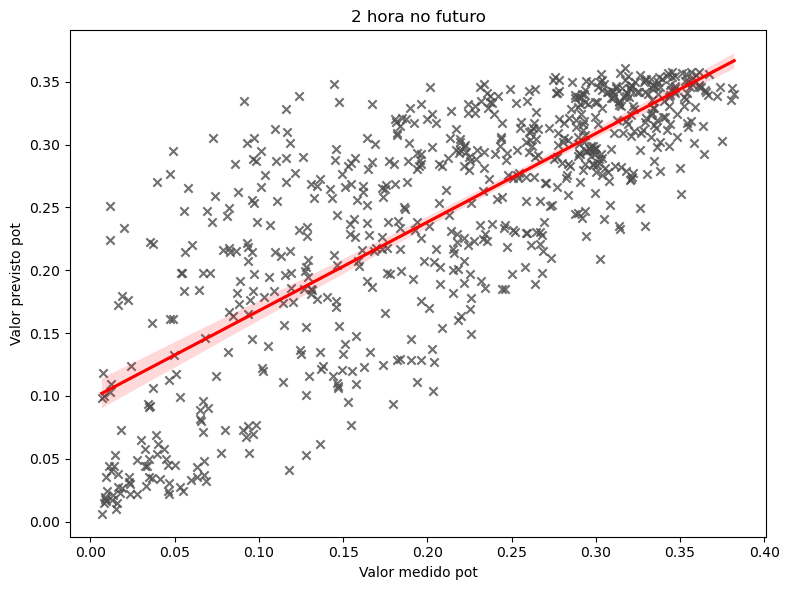

   --- Hora 3 Futuro ---   
RMSE: 0.0773849934263263 
Vies: 0.141219622308459 
Correlação: 0.7160125353635949 
Intercept: 0.08820064584006579 
Skill Score: 0.1815751036827199 
#Previsões: 622 
RMSE Persistencia: 0.09455356719295883 



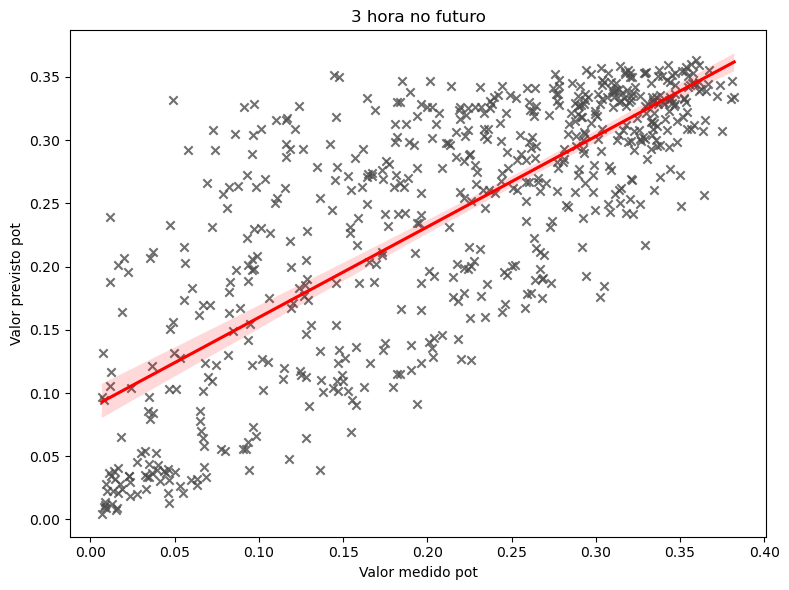

  ===Meses Secos===   
   --- Hora 1 Futuro ---   
RMSE: 0.06158578800335828 
Vies: 0.17125518871903736 
Correlação: 0.7787488041926383 
Intercept: 0.08875163980318812 
Skill Score: -0.2940881406720379 
#Previsões: 755 
RMSE Persistencia: 0.04759010307549525 



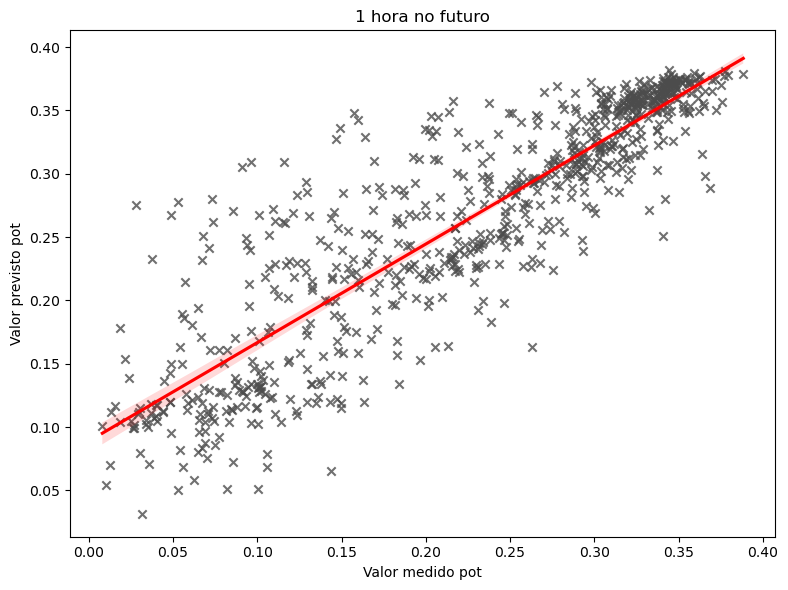

   --- Hora 2 Futuro ---   
RMSE: 0.06406621471800232 
Vies: 0.13342340285379567 
Correlação: 0.7688688465851066 
Intercept: 0.07849068411687268 
Skill Score: 0.13021819142325608 
#Previsões: 721 
RMSE Persistencia: 0.07365780025088847 



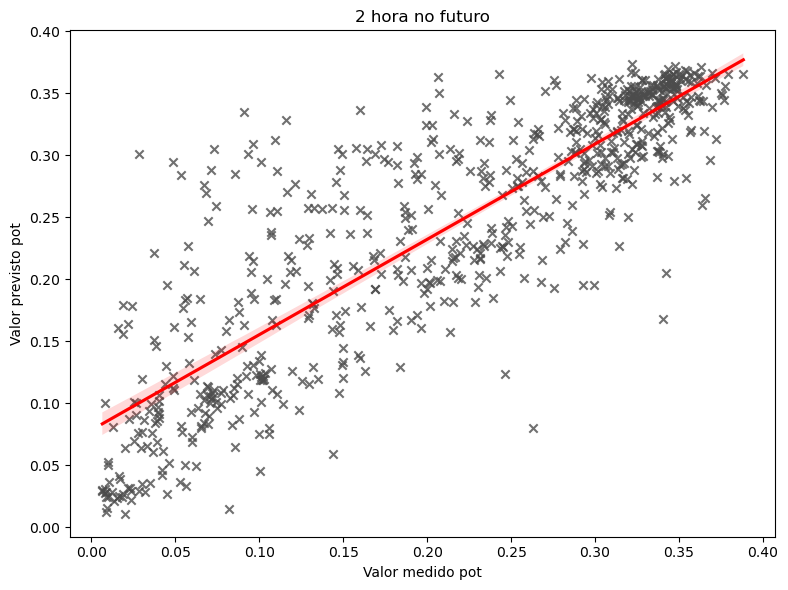

   --- Hora 3 Futuro ---   
RMSE: 0.06719416809474006 
Vies: 0.09482884089035287 
Correlação: 0.7577316025933042 
Intercept: 0.0714531420970965 
Skill Score: 0.26996742123767203 
#Previsões: 628 
RMSE Persistencia: 0.09204269788707065 



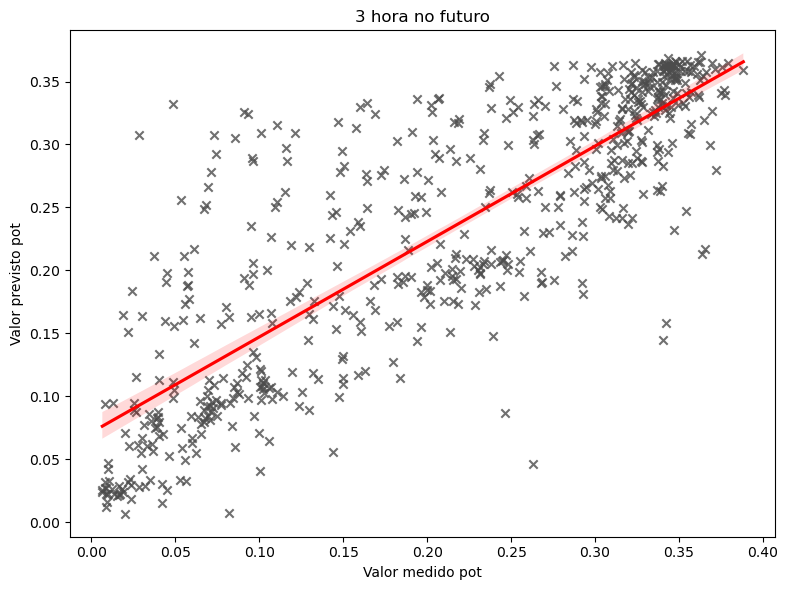

,Previsao_1,Previsao_2,Previsao_3,Observado,P1,P2,P3
Date_Time,,,,,,,
2021-01-18 08:00:00,0.190301,NaN,NaN,0.220913,0.243963,0.454431,0.000000
2021-01-18 09:00:00,0.291722,0.277849,NaN,0.254390,0.308361,0.340535,0.634316
2021-01-18 10:00:00,0.336880,0.334149,0.323080,0.299318,0.307982,0.373323,0.412275
2021-01-18 11:00:00,0.352359,0.344396,0.349667,0.320312,0.329110,0.338636,0.410480
2021-01-18 12:00:00,0.357880,0.333512,0.333456,0.252807,0.335379,0.344591,0.354565
...,...,...,...,...,...,...,...
2021-12-31 15:00:00,0.181155,0.178394,0.163581,0.006058,0.030508,0.069681,0.114188
2021-12-31 16:00:00,0.120598,0.112523,0.103568,0.046365,0.004739,0.023863,0.054504
2021-12-31 17:00:00,0.057232,0.044596,0.036467,0.010732,0.029939,0.003060,0.015409


In [14]:
avaliacao_ae_chuva_seco(model, xs, ys, ysi,df[['P1','P2','P3']])

In [38]:
salvar(model, 'LSTM_ED_48t_200u_3f_IZA.h5')

Modelo salvo!


## Teste temp, vento, umidade, angulos

In [7]:
def janela_flutuante(df, n_past, n_future):

    yt= []
    xt = []
    y_index = []
    #kt = []
    input_tag = ['cos_zenith','sin_azimuth', 
                 'Velocidade média do vento m/s','Umidade Relativa %','Temperatura ambiente °C']
    index = df.loc[(df['zenith'] < 70) & (df['Pot_BT'].isnull() == False)].index
        

        #Janela deslizante
    for i in index:
        #(np.isin(df['Pot_BT'].loc['2018-01-01 00:00:00':'2018-01-01 23:00:00'].value_counts().index,-1).sum())
        if (np.isin(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts().index, -1).sum() == 0):
            if len(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)]) == n_past:
                if df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)].isnull().sum().sum() == 0:
                    y_index.append(df.loc[i:i + datetime.timedelta(hours=n_future-1)].index)
                    # Seleção da Potencia [dia que queres prever : até que dia no futuro] 
                    yt.append(df[['Pot_BT']].loc[i:i + datetime.timedelta(hours=n_future-1)])
                    #
                    xt.append(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)])
                    #kt.append(df[['Irradiação Global horária(Inclinada 27°) kWh/m2', 'Temperatura ambiente °C']].loc[i:i + datetime.timedelta(hours=n_future-1)])

    
    xt, yt = np.array(xt), np.array(yt)
    #y_index = np.array(y_index)
    #kt = np.array(kt)
        
    #return xt, yt, kt
    return xt, yt, y_index

In [8]:
n_past, n_fut = 48,3

#treino
xt, yt, yti = janela_flutuante(df_treino, n_past, n_fut)
#validação
xv, yv, yvi = janela_flutuante(df_valida, n_past, n_fut)
#teste
xs, ys, ysi = janela_flutuante(df_teste, n_past, n_fut)

### Encoder Decoder

2024-04-09 12:32:14.658387: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-09 12:32:14.694101: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-09 12:32:14.694157: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-09 12:32:14.695111: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 200)               164800    
                                                                 
 repeat_vector (RepeatVector  (None, 3, 200)           0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 3, 200)            320800    
                                                                 
 time_distributed (TimeDistr  (None, 3, 100)           20100     
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 3, 1)             101       
 tributed)                                                       
                                                        

2024-04-09 12:32:18.097060: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


198/198 [==============================] - 28s 129ms/step - loss: 0.0139 - val_loss: 0.0070
Epoch 2/1000
198/198 [==============================] - 24s 123ms/step - loss: 0.0098 - val_loss: 0.0061
Epoch 3/1000
198/198 [==============================] - 25s 128ms/step - loss: 0.0093 - val_loss: 0.0113
Epoch 4/1000
198/198 [==============================] - 25s 124ms/step - loss: 0.0088 - val_loss: 0.0087
Epoch 5/1000
198/198 [==============================] - 24s 121ms/step - loss: 0.0087 - val_loss: 0.0101
Epoch 6/1000
198/198 [==============================] - 25s 128ms/step - loss: 0.0085 - val_loss: 0.0111
Epoch 7/1000
198/198 [==============================] - 25s 128ms/step - loss: 0.0085 - val_loss: 0.0066
Epoch 8/1000
198/198 [==============================] - 25s 128ms/step - loss: 0.0084 - val_loss: 0.0121
Epoch 9/1000
198/198 [==============================] - 24s 120ms/step - loss: 0.0082 - val_loss: 0.0095
Epoch 10/1000
198/198 [==============================] - 24s 123ms/s

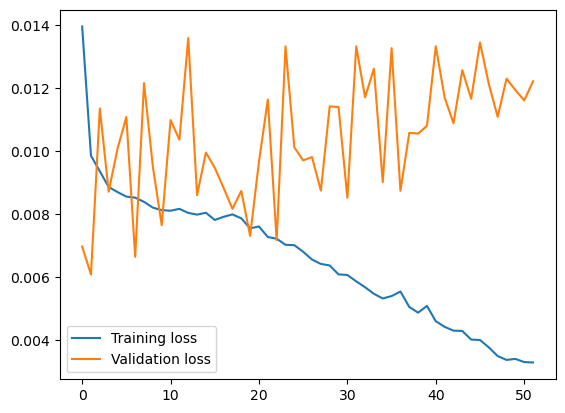

In [9]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

n_outputs = yt.shape[1]

model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(n_past, 5)))
model.add(RepeatVector(n_outputs))
model.add(LSTM(200, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(100, activation='relu')))
model.add(TimeDistributed(Dense(1)))
model.compile(loss='mse', optimizer='adam')

model.summary()

early_stopping = EarlyStopping(monitor='val_loss',         
                                   patience=50,               
                                   restore_best_weights=True) 
    
history = model.fit(xt, 
                    yt, 
                    epochs=1000, 
                    batch_size=32, 
                    verbose=1,
                    callbacks = [early_stopping],
                    validation_data=(xv, yv))
    
rmse = np.sqrt(min(history.history['val_loss']))

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

44/44 [==============================] - 1s 17ms/step
   --- Hora 1 Futuro ---   
RMSE: 0.07039322894816935 
Vies: -0.005521800456375223 
Correlação: 0.5107609552982088 
Intercept: 0.10682203694826978 
Skill Score: -0.3518719826048622 
#Previsões: 1380 
RMSE Persistencia: 0.05207092820470453 



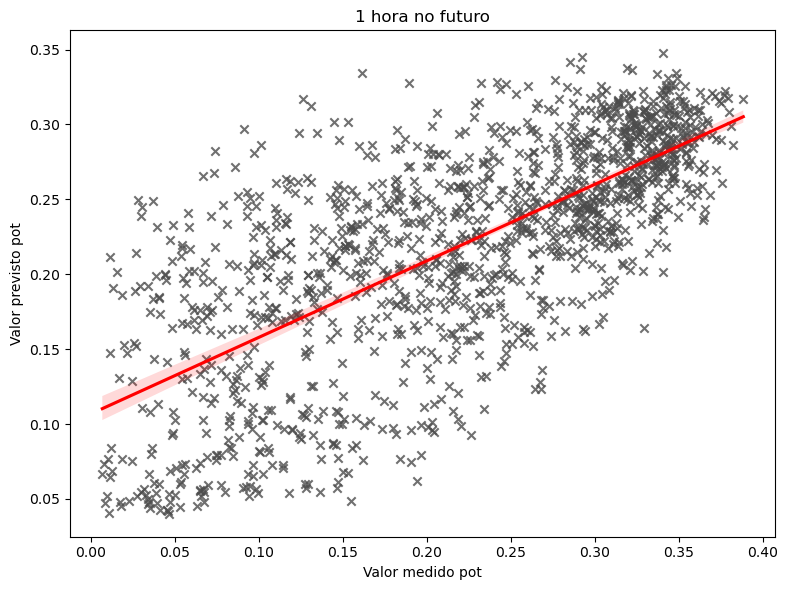

   --- Hora 2 Futuro ---   
RMSE: 0.0734724978415458 
Vies: -0.04781512546003772 
Correlação: 0.6015865946617084 
Intercept: 0.07519943737919677 
Skill Score: 0.04113958961440567 
#Previsões: 1306 
RMSE Persistencia: 0.07662481112553152 



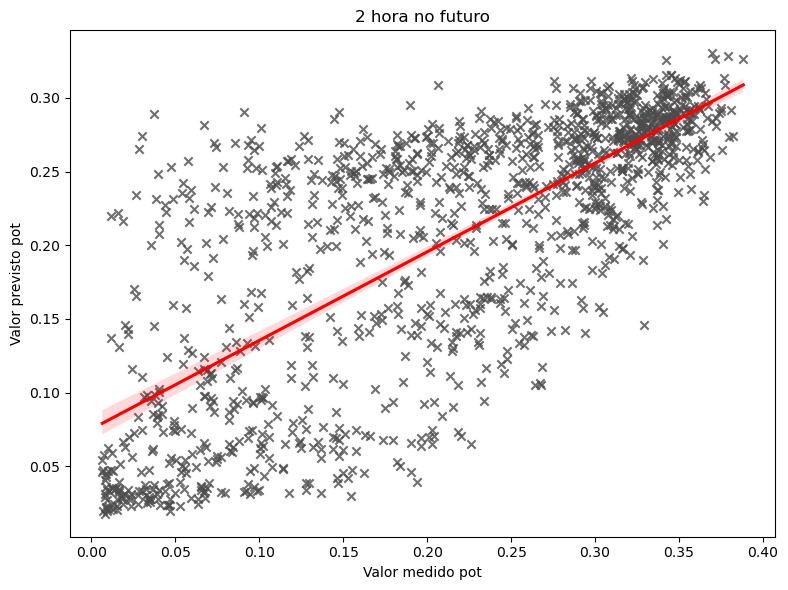

   --- Hora 3 Futuro ---   
RMSE: 0.07403728080742206 
Vies: -0.06490361716527877 
Correlação: 0.621139795940388 
Intercept: 0.06669011006863221 
Skill Score: 0.21799523701993984 
#Previsões: 1150 
RMSE Persistencia: 0.09467625302598047 



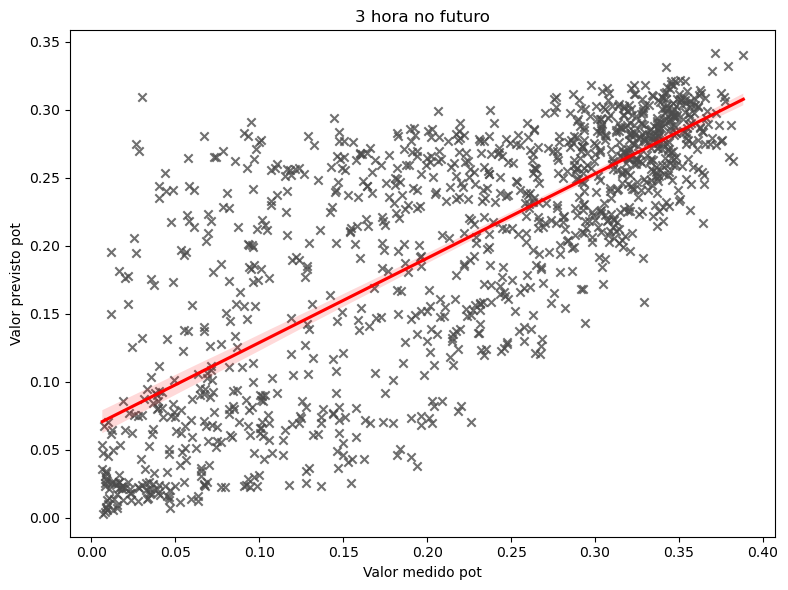

In [13]:
z = avaliacao_ae(model, xs, ys, ysi, df[['P1','P2','P3']])

44/44 [==============================] - 1s 16ms/step
  ===Meses Chuvosos===   
   --- Hora 1 Futuro ---   
RMSE: 0.07020810739119318 
Vies: 0.0289795425923853 
Correlação: 0.5745679976660417 
Intercept: 0.09474708434155865 
Skill Score: -0.2680963126565099 
#Previsões: 742 
RMSE Persistencia: 0.055364964546041145 



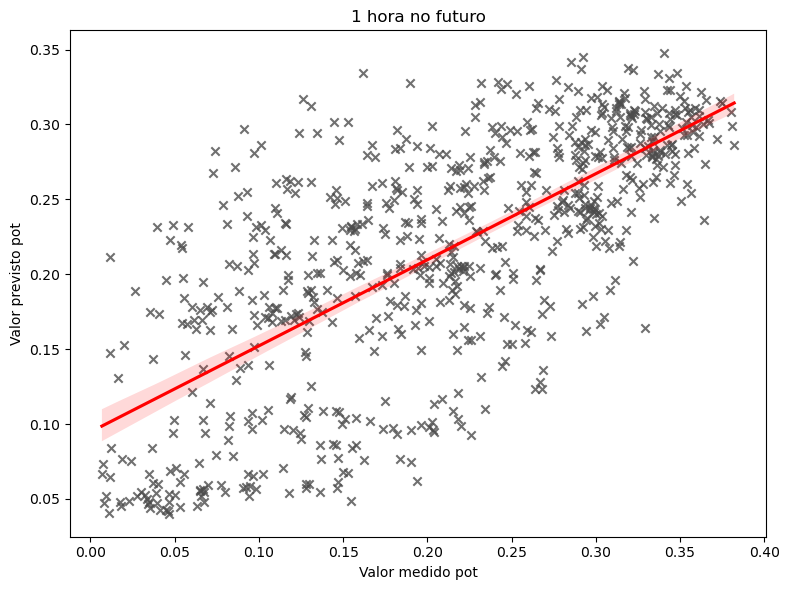

   --- Hora 2 Futuro ---   
RMSE: 0.07336965030391623 
Vies: -0.04081819071881252 
Correlação: 0.6399604203806023 
Intercept: 0.06623489594881207 
Skill Score: 0.05706998130711727 
#Previsões: 697 
RMSE Persistencia: 0.0778102816215602 



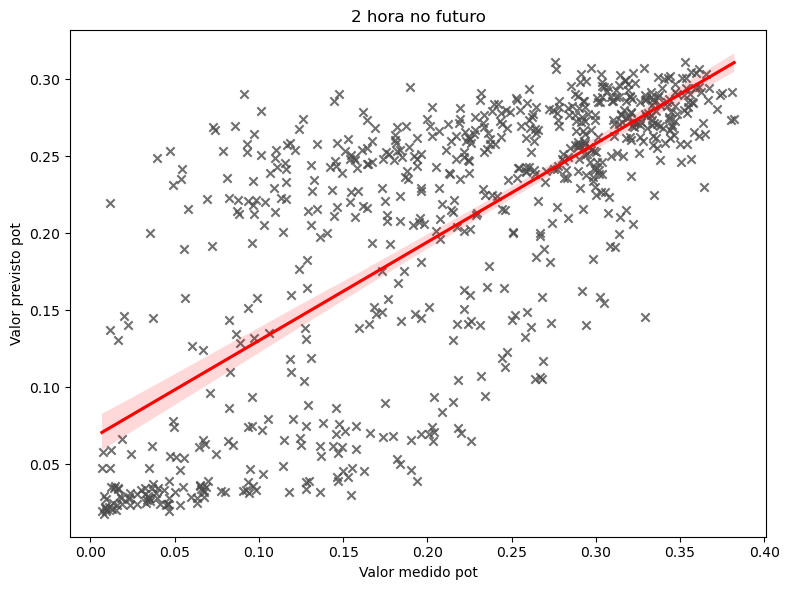

   --- Hora 3 Futuro ---   
RMSE: 0.07406828035546949 
Vies: -0.075091538536391 
Correlação: 0.6426033995193888 
Intercept: 0.058558499027624805 
Skill Score: 0.2166527128023028 
#Previsões: 622 
RMSE Persistencia: 0.09455356719295883 



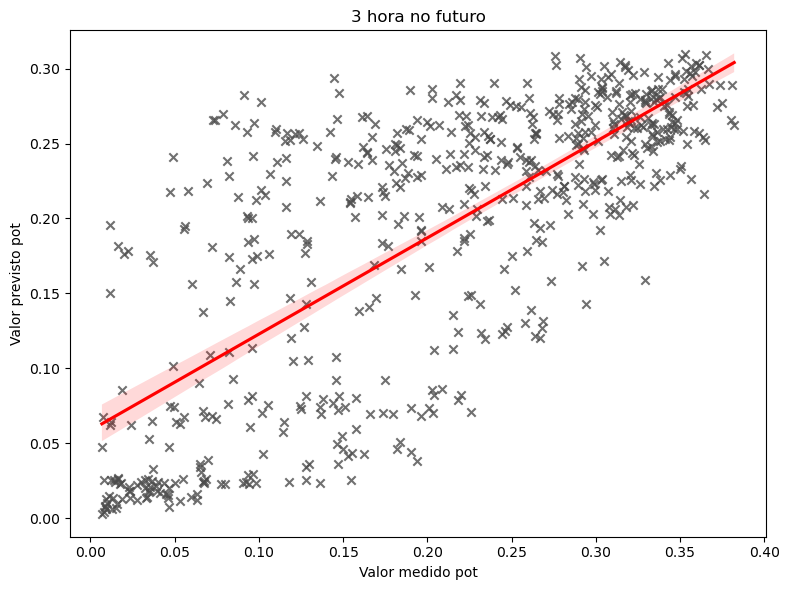

  ===Meses Secos===   
   --- Hora 1 Futuro ---   
RMSE: 0.0735716909916084 
Vies: -0.014752990793862397 
Correlação: 0.43655539697807283 
Intercept: 0.12406748590918909 
Skill Score: -0.5459451910599329 
#Previsões: 755 
RMSE Persistencia: 0.04759010307549525 



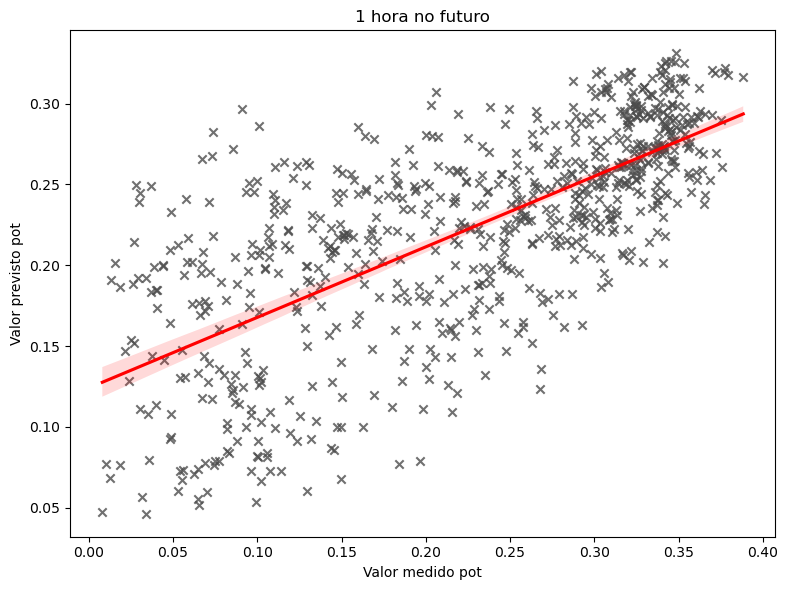

   --- Hora 2 Futuro ---   
RMSE: 0.07588690653941928 
Vies: -0.03562770368194187 
Correlação: 0.5542535285171145 
Intercept: 0.08830091984953664 
Skill Score: -0.030263003795092613 
#Previsões: 721 
RMSE Persistencia: 0.07365780025088847 



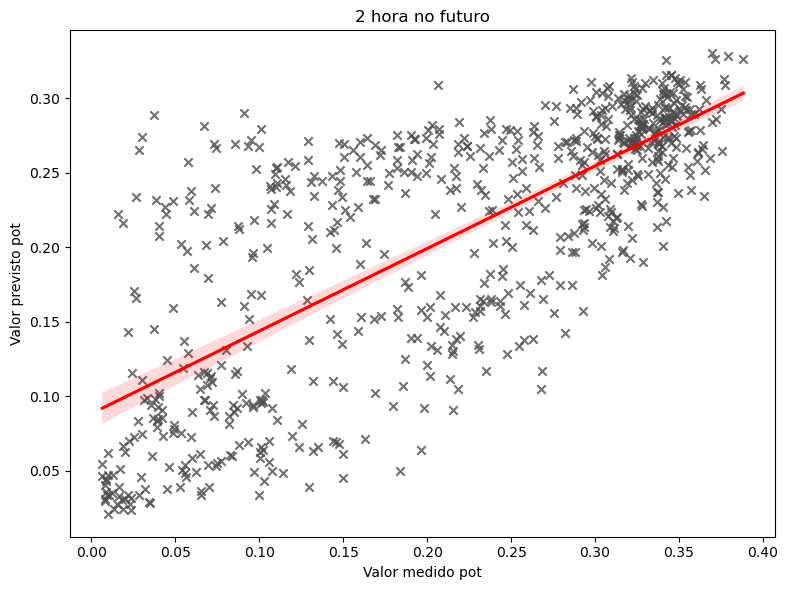

   --- Hora 3 Futuro ---   
RMSE: 0.07615992941184628 
Vies: -0.037537538038226154 
Correlação: 0.5847064045115151 
Intercept: 0.08007142801700194 
Skill Score: 0.1725587019918876 
#Previsões: 628 
RMSE Persistencia: 0.09204269788707065 



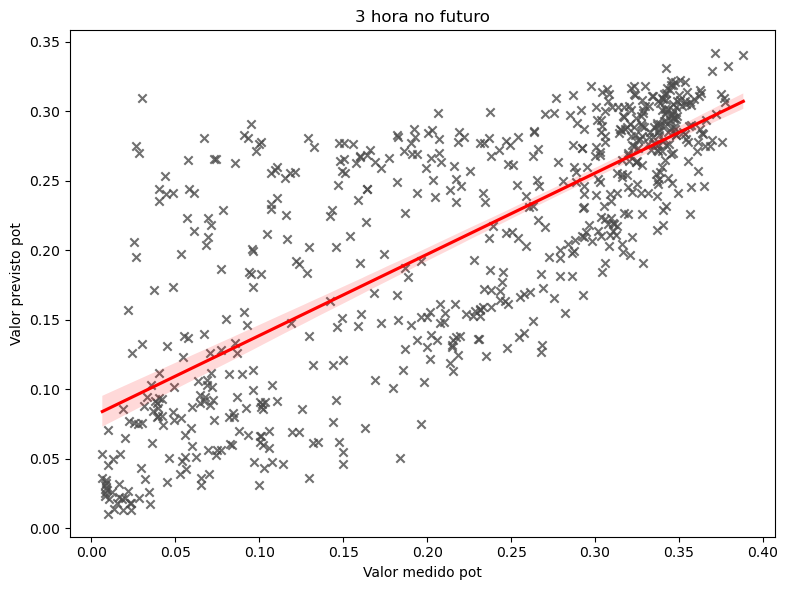

,Previsao_1,Previsao_2,Previsao_3,Observado,P1,P2,P3
Date_Time,,,,,,,
2021-01-18 08:00:00,0.203897,NaN,NaN,0.220913,0.243963,0.454431,0.000000
2021-01-18 09:00:00,0.242532,0.242529,NaN,0.254390,0.308361,0.340535,0.634316
2021-01-18 10:00:00,0.279183,0.273284,0.262719,0.299318,0.307982,0.373323,0.412275
2021-01-18 11:00:00,0.306244,0.288194,0.282383,0.320312,0.329110,0.338636,0.410480
2021-01-18 12:00:00,0.320604,0.287432,0.274875,0.252807,0.335379,0.344591,0.354565
...,...,...,...,...,...,...,...
2021-12-31 15:00:00,0.096726,0.096985,0.144074,0.006058,0.030508,0.069681,0.114188
2021-12-31 16:00:00,0.053396,0.038741,0.047186,0.046365,0.004739,0.023863,0.054504
2021-12-31 17:00:00,0.040663,0.022243,0.014581,0.010732,0.029939,0.003060,0.015409


In [14]:
avaliacao_ae_chuva_seco(model, xs, ys, ysi,df[['P1','P2','P3']])

In [38]:
salvar(model, 'LSTM_ED_48t_200u_3f_VUTZA.h5')

Modelo salvo!


-----------

## Grid Search CV

In [4]:
#Grid Search CV
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM, Bidirectional
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

def janela_flutuante(df, n_past, n_future, input_tag):

    yt= []
    xt = []
    y_index = []
    #kt = []
    
    index = df.loc[(df['Pot_BT'].isnull() == False)].index
       
        #Janela deslizante
    for i in index:
        #(np.isin(df['Pot_BT'].loc['2018-01-01 00:00:00':'2018-01-01 23:00:00'].value_counts().index,-1).sum())
        if (np.isin(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts().index, -1).sum() == 0):
            #evitar que tenha [0,0,0] adicionado agr
            if len(df['Pot_BT'].loc[i:i + datetime.timedelta(hours=n_future-1)].value_counts())>=n_future:
                if len(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)]) == n_past:
                    if df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)].isnull().sum().sum() == 0:
                        y_index.append(df.loc[i:i + datetime.timedelta(hours=n_future-1)].index)
                        # Seleção da Potencia [dia que queres prever : até que dia no futuro] 
                        yt.append(df[['Pot_BT']].loc[i:i + datetime.timedelta(hours=n_future-1)])
                        #
                        xt.append(df[input_tag].loc[i - datetime.timedelta(hours = n_past) : i - datetime.timedelta(hours = 1)])
                        #kt.append(df[['Irradiação Global horária(Inclinada 27°) kWh/m2', 'Temperatura ambiente °C']].loc[i:i + datetime.timedelta(hours=n_future-1)])

    
    xt, yt = np.array(xt), np.array(yt)
    y_index = np.array(y_index)
    #kt = np.array(kt)
        
    #return xt, yt, kt
    return xt, yt, y_index

def lstm_ad (unit,dense, n_past, n_fut,dim):
    model = Sequential()
    model.add(LSTM(unit, activation='relu', input_shape=(n_past, dim)))
    #model.add(Bidirectional(LSTM(unit, activation='relu', input_shape=(n_past, 3))))
    model.add(RepeatVector(n_fut))
    model.add(LSTM(unit, activation='relu', return_sequences=True))
    model.add(TimeDistributed(Dense(dense, activation='relu')))
    model.add(TimeDistributed(Dense(1)))
    model.compile(loss='mse', optimizer='adam')
    #model.build((None, n_past, 3))
    model.summary()
    
    return model

# Parâmetros para Grid Search
timesteps = [48,72,24]
units_dense = [100]
units1_list = [100, 200, 300]
dropout_list = [0.2]

# DataFrame para armazenar resultados
results_df = pd.DataFrame(columns=['Timesteps', 'Units Dense','Units1', 'RMSE'])

n_fut = 3

input_dim = ['Pot_BT', 'cos_zenith', 'Temperatura ambiente °C',
            'Velocidade média do vento m/s','Umidade Relativa %','sin_azimuth','Degradacao']

#input_dim = ['Pot_BT']
# Loop através dos parâmetros
for n_past in timesteps:
    xt, yt, yti = janela_flutuante(df_treino[len(df_treino)//2:], n_past, n_fut, input_dim) #treino
    del(yti)
    xv, yv, yvi = janela_flutuante(df_valida[:len(df_valida)//2], n_past, n_fut, input_dim) #validação
    del(yvi)
    
    for u1 in units1_list:
        for d in units_dense:
            rmse_list = []
            
            for _ in range(5):  # Executar 5 vezes e calcular a média
                # Aqui você criaria sua base de treino e teste
                # Substitua as linhas abaixo com sua própria lógica de criação de dados
                model = lstm_ad(u1,d, n_past, n_fut, xt.shape[2]) 
                #model = lstm([u1], n_past, n_fut, xt.shape[2],'relu', 0)    
                early_stopping = EarlyStopping(monitor='val_loss',         
                                                   patience=25,               
                                                   restore_best_weights=True)
                history = model.fit(xt, 
                                    yt, 
                                    epochs=1000, 
                                    batch_size=64, 
                                    verbose=1,
                                    callbacks = [early_stopping],
                                    validation_data=(xv, yv))
                rmse = np.sqrt(min(history.history['val_loss']))

                rmse_list.append(rmse)

                print(f"Timesteps: {n_past}| Units Dense: {d}| Units1: {u1}| Rodada: {_}| RMSE: {rmse}")
            
            avg_rmse = np.mean(rmse_list)
            results_df = results_df._append({'Timesteps': n_past, 'Units Dense': d,'Units1': u1, 'RMSE': avg_rmse}, ignore_index=True)
            
# Visualizar os resultados
print(results_df)

2024-10-19 09:56:04.851142: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-10-19 09:56:04.964948: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-10-19 09:56:04.965026: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:07:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-10-19 09:56:04.966062: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 200)               166400    
                                                                 
 repeat_vector (RepeatVector  (None, 3, 200)           0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 3, 200)            320800    
                                                                 
 time_distributed (TimeDistr  (None, 3, 100)           20100     
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 3, 1)             101       
 tributed)                                                       
                                                        

2024-10-19 09:56:08.921594: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


75/75 [==============================] - 14s 156ms/step - loss: 0.0111 - val_loss: 0.0044
Epoch 2/1000
75/75 [==============================] - 11s 145ms/step - loss: 0.0055 - val_loss: 0.0048
Epoch 3/1000
75/75 [==============================] - 11s 149ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 4/1000
75/75 [==============================] - 11s 147ms/step - loss: 0.0039 - val_loss: 0.0050
Epoch 5/1000
75/75 [==============================] - 12s 156ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 6/1000
75/75 [==============================] - 12s 157ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 7/1000
75/75 [==============================] - 12s 156ms/step - loss: 0.0032 - val_loss: 0.0039
Epoch 8/1000
75/75 [==============================] - 12s 156ms/step - loss: 0.0034 - val_loss: 0.0031
Epoch 9/1000
75/75 [==============================] - 12s 155ms/step - loss: 0.0030 - val_loss: 0.0031
Epoch 10/1000
75/75 [==============================] - 11s 148ms/step - loss: 0.0029 -

/tmp/ipykernel_1381/2142485369.py:102: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = results_df._append({'Timesteps': n_past, 'Units Dense': d,'Units1': u1, 'RMSE': avg_rmse}, ignore_index=True)


75/75 [==============================] - 13s 160ms/step - loss: 0.0108 - val_loss: 0.0042
Epoch 2/1000
75/75 [==============================] - 12s 159ms/step - loss: 0.0058 - val_loss: 0.0036
Epoch 3/1000
75/75 [==============================] - 13s 168ms/step - loss: 0.0045 - val_loss: 0.0036
Epoch 4/1000
75/75 [==============================] - 12s 163ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 5/1000
75/75 [==============================] - 12s 157ms/step - loss: 0.0038 - val_loss: 0.0028
Epoch 6/1000
75/75 [==============================] - 11s 146ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 7/1000
75/75 [==============================] - 11s 145ms/step - loss: 0.0031 - val_loss: 0.0027
Epoch 8/1000
75/75 [==============================] - 11s 148ms/step - loss: 0.0030 - val_loss: 0.0030
Epoch 9/1000
75/75 [==============================] - 11s 142ms/step - loss: 0.0031 - val_loss: 0.0029
Epoch 10/1000
75/75 [==============================] - 11s 144ms/step - loss: 0.0030 -

In [5]:
results_df

,Timesteps,Units Dense,Units1,RMSE
0,48.0,100.0,200.0,0.051676
1,48.0,100.0,300.0,0.050948
2,72.0,100.0,200.0,0.051338
3,72.0,100.0,300.0,0.051110
4,24.0,100.0,200.0,0.051398
5,24.0,100.0,300.0,0.051325


# Analise

In [13]:
import re
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
class Avaliacao:
    def __init__(self, dataframe_treino):
        self.df = dataframe_treino[['P1', 'P2', 'P3', 'zenith', 'Month', 'Pot_BT',"Irrad/CeuClaro",
                                    'Irradiação Global horária(Inclinada 27°) kWh/m2']]
        self.df = self.df.rename(columns={'Irrad/CeuClaro': 'kt',
                                          'Pot_BT': 'Observado'})
        
        # Filtro: Observado ser maior que zero 
        self.df = self.df.loc[self.df['Observado'] > 0]

    def adicionar_modelo(self, modelo, xs, ys, ysi, nome_modelo: str):
        previsao = modelo.predict(xs)
        dfs_previsoes = self.criar_df(ysi, previsao, nome_modelo)

        df_final = pd.concat(dfs_previsoes, axis=1)
        self.df = self.df.join(df_final)
        self.df = self.df.loc[self.df['Observado'].notna()]

        # Adiciona condição de céu
        self.df["Condição de céu"] = self.df["kt"].apply(self.sky_condition)

        # Adiciona classificação do mês
        self.df["Tipo de mes"] = self.df['Month'].apply(self.month_classification)

        # Adiciona classificação de zenite
        self.df["Faixa zenith"] = self.df['zenith'].apply(self.zenith_condition)

    @staticmethod
    def criar_df(ysi, valores, prefixo):
        try:
            return [pd.DataFrame(
                [{"Date_Time": i[h], f"{prefixo}_{h+1}": j[h][0]} for i, j in zip(ysi, valores)]
            ).set_index("Date_Time") for h in range(3)]
        except IndexError:  # Captura um possível erro de índice
            return [pd.DataFrame(
                [{"Date_Time": i[h], f"{prefixo}_{h+1}": j[h]} for i, j in zip(ysi, valores)]
            ).set_index("Date_Time") for h in range(3)]

    @staticmethod
    def sky_condition(kt):
        if kt > 0.65:
            return "Claro"
        elif kt < 0.4:
            return "Nublado"
        else:
            return "Parcialmente Nublado"

    @staticmethod
    def zenith_condition(zenith):
        if zenith >= 60:
            return "Maior que 60 graus"
        elif zenith <= 30:
            return "Menor que 30 graus"
        else:
            return "Entre 30 e 60 graus"

    @staticmethod
    def month_classification(month_num):
        if 4 <= month_num <= 9:
            return "Seco"  # Dry months: May to October
        else:
            return "Chuvoso"  # Rainy months: November to April

    def calcular_erros(self, data, i):
        list_info = []
        for m in [item for item in data.columns if item != 'Observado']:
            rmse_per = mean_squared_error(data[f'P{i}'], data['Observado'], squared=False)

            dict_info = {
                'RMSE': mean_squared_error(data[m], data['Observado'], squared=False),
                'pRMSE':mean_squared_error(data[m], data['Observado'], squared=False)/np.mean(data['Observado']),
                'MBE': np.mean(data[m] - data['Observado']),
                'pMBE': np.mean(data[m] - data['Observado']) / np.mean(data['Observado']),
                'MAE': mean_absolute_error(data[m], data['Observado']),
                'pMAE':mean_absolute_error(data[m], data['Observado'])/np.mean(data['Observado']),                
                'R2': data[[m, 'Observado']].corr().iloc[0, 1],
                'SS': 1 - (mean_squared_error(data[m], data['Observado'], squared=False) / rmse_per),
                'Razão std': data[m].std() / data['Observado'].std(),
                'Média Observado':np.mean(data['Observado']),
                'Previsões': len(data['Observado']),
                'Modelo': m,
                'Horizonte': i
            }

            list_info.append(dict_info)
        return list_info

    def erros(self, condicao='Normal'):
        itens_para_remover = ['zenith', 'Month', 'Observado', 'kt']
        modelos = [item for item in self.df.columns if item not in itens_para_remover]
        list_info = []

        for i in range(1, 4):
            modelos_com_i = [item for item in modelos if f'{i}' in item]
            modelos_com_i.append('Observado')

            if condicao == "Normal":
                data = self.df[modelos_com_i]
                data = data.dropna()
                list_info.extend(self.calcular_erros(data, i))
            else:
                for cond in self.df[condicao].unique():
                    data = self.df.loc[self.df[condicao] == cond, modelos_com_i]
                    data = data.dropna()
                    valores = self.calcular_erros(data, i)
                    for entry in valores:
                        entry['Condição'] = cond
                    list_info.extend(valores)
        self.df_info = pd.DataFrame(list_info)


In [14]:
import tensorflow as tf
import os

# Função para obter o índice de entrada
def obter_entrada(tamanho):
    if tamanho == 1:
        return 0
    elif tamanho == 3:
        return 1
    elif tamanho == 6:
        return 2
    else:
        return 3

# Configurações iniciais
resultados = Avaliacao(df_teste)
path_model = r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/teste/"
modelos = os.listdir(path_model)
input_options = [
    ['Pot_BT'],
    ['Pot_BT', 'cos_zenith', 'sin_azimuth'],
    ['Irradiação Global horária(Inclinada 27°) kWh/m2', 'cos_zenith', 'sin_azimuth', 'Velocidade média do vento m/s', 'Umidade Relativa %', 'Temperatura ambiente °C'],
    ['Pot_BT', 'cos_zenith', 'sin_azimuth', 'Degradacao', 'Velocidade média do vento m/s', 'Umidade Relativa %', 'Temperatura ambiente °C']
]
erro = list()
certo = list()

for m in modelos:
    try:
        model_path = os.path.join(path_model, m)
        model = tf.keras.models.load_model(model_path)
        
        # Extraindo partes relevantes do nome do modelo
        parts = m.split('_')
        janela = int(parts[1][:2])
        input_idx = obter_entrada(len(parts[-1][:-3]))
        
        # Obtendo janelas e entradas apropriadas
        xs, ys, ysi = janela_flutuante(df_teste, janela, 3, input_options[input_idx])
        
        # Adicionando o modelo aos resultados
        resultados.adicionar_modelo(model, xs, ys, ysi, f"{parts[0]}_{parts[-1][:-3]}")
        certo.append(m)
    except Exception as e:
        erro.append((m, str(e)))

del(xs,ys,ysi)
# Opcional: Exibir erros detalhados para debug
for model_name, error in erro:
    print(f"Erro ao processar o modelo {model_name}: {error}")

123/123 [==============================] - 2s 14ms/step


In [15]:
resultados.erros('Faixa zenith')
z = resultados.df_info

resultados.erros('Condição de céu')
cc = resultados.df_info

resultados.erros('Tipo de mes')
mes = resultados.df_info

resultados.erros()
n = resultados.df_info

In [38]:
resultados.erros()
resultados.df_info.to_csv(r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/tabelas csv/normal_teste.csv")

resultados.erros('Tipo de mes')
resultados.df_info.to_csv(r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/tabelas csv/mes_teste.csv")

resultados.erros("Condição de céu")
resultados.df_info.to_csv(r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/tabelas csv/ceu_teste.csv")

resultados.erros("Faixa zenith")
resultados.df_info.to_csv(r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/tabelas csv/zenith_teste.csv")

resultados.df.to_csv(r"/mnt/c/Users/ferna/OneDrive/Documentos/mestrado/Modelos/Base de dados novas/tabelas csv/df_teste.csv")

In [10]:
resultados.erros()
resultados.df_info

,RMSE,pRMSE,MBE,pMBE,MAE,pMAE,R2,SS,Razão std,Média Observado,Previsões,Modelo,Horizonte
0,0.050053,0.298141,0.012318,0.073370,0.036135,0.215235,0.916128,0.000000,1.052334,0.167885,3619,P1,1
1,0.042349,0.252252,-0.003194,-0.019025,0.029480,0.175594,0.929784,0.153917,0.947685,0.167885,3619,EDLSTM_PAZ_1,1
2,0.124882,0.743856,0.100221,0.596962,0.103506,0.616529,0.828307,-1.494980,0.498297,0.167885,3619,EDLSTM_PAZTVUD_1,1
3,0.083358,0.537488,0.019637,0.126615,0.059167,0.381506,0.827748,0.000000,1.219674,0.155089,3926,P2,2
4,0.052873,0.340921,0.004065,0.026209,0.036899,0.237922,0.897335,0.365714,0.957055,0.155089,3926,EDLSTM_PAZ_2,2
5,0.169699,1.094210,0.134595,0.867858,0.139430,0.899032,0.525719,-1.035785,0.328677,0.155089,3926,EDLSTM_PAZTVUD_2,2
6,0.123449,0.735484,0.019222,0.114518,0.089244,0.531693,0.698180,0.000000,1.487724,0.167848,3614,P3,3
7,0.063166,0.376327,0.011147,0.066412,0.045130,0.268877,0.846161,0.488327,0.952372,0.167848,3614,EDLSTM_PAZ_3,3
8,0.164774,0.981685,0.120192,0.716076,0.132387,0.788734,0.218835,-0.334748,0.354331,0.167848,3614,EDLSTM_PAZTVUD_3,3
